In [70]:
import math
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import keras
from tensorflow.keras import Model
from tensorflow.keras import Sequential
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from tensorflow.keras.losses import MeanSquaredLogarithmicError
import numpy as np
import pickle
np.random.seed(0)
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv1D, Conv2D, LeakyReLU, MaxPool1D, AveragePooling1D, UpSampling1D, Flatten, Dense, Reshape, BatchNormalization
from tensorflow.keras import initializers
from sklearn.decomposition import PCA
from matplotlib.pyplot import figure
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

from keras.optimizers import Adam, SGD, Adadelta

In [71]:
x_train_scaled = pd.read_csv('../data/260_sample_train_scaled.csv').set_index("Patient_ID")
x_train_scaled

,AADAC,APOA1,APOA4,APOB,APOC3,AQP9,C6,CEACAM7,CHI3L1,ABCC2,...,PPP1R17,WNT8A,LSM5,PCDHB3,GUSBP11,C16orf78,C5orf17,LOC100132831,LOC100288778,LOC100505851
Patient_ID,,,,,,,,,,,,,,,,,,,,,
55_control,0.702813,0.799052,0.719665,0.729547,0.794953,0.256451,1.000000,0.363133,0.374212,0.611161,...,0.932722,0.806913,0.653998,0.860533,0.837016,1.0,0.550415,0.000000,0.778617,0.940755
168_CD_plain,0.751408,0.603707,0.622768,0.627712,0.606860,0.520576,0.311962,0.251356,0.553554,0.441131,...,0.000000,0.000000,0.692339,0.578107,0.619998,0.0,0.000000,0.000000,0.607899,0.206271
72_control,0.786508,0.755331,0.739605,0.756170,0.819875,0.391132,0.648401,0.134017,0.200420,0.679453,...,0.000000,0.505180,0.644769,0.603195,0.756754,0.0,0.350566,0.000000,0.899508,0.014040
120_control,0.707491,0.662993,0.648072,0.764621,0.654276,0.633929,0.579519,0.248934,0.759250,0.755407,...,0.000000,0.000000,0.131632,0.053179,0.774455,0.0,0.000000,0.000000,0.528882,0.305806
258_CD_plain,0.701039,0.662511,0.707208,0.834562,0.670160,0.410612,0.370517,0.244987,0.445387,0.798000,...,0.000000,0.000000,0.085440,0.761822,0.860355,0.0,0.000000,0.000000,0.604102,0.014040
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15_CD_plain,0.382762,0.384030,0.377332,0.360165,0.300915,0.340090,0.077348,0.890965,0.261140,0.205779,...,0.000000,0.000000,0.149005,0.740343,0.641698,0.0,0.000000,0.694951,0.485461,0.300471
182_CD_plain,0.679910,0.584723,0.722426,0.643867,0.740014,0.650358,0.468650,0.295686,0.649939,0.609862,...,0.000000,0.000000,0.229358,0.640000,0.731908,0.0,0.422815,0.096205,0.502320,0.615334
164_CD_plain,0.754656,0.556562,0.694062,0.748334,0.535534,0.133869,0.319071,0.154562,0.440487,0.824013,...,0.000000,0.000000,0.211405,0.797333,0.896369,0.0,0.234352,0.000000,0.496177,0.402714


In [72]:
x_test_scaled = pd.read_csv('../data/260_sample_test_scaled.csv').set_index("Patient_ID")
x_test_scaled

,AADAC,APOA1,APOA4,APOB,APOC3,AQP9,C6,CEACAM7,CHI3L1,ABCC2,...,PPP1R17,WNT8A,LSM5,PCDHB3,GUSBP11,C16orf78,C5orf17,LOC100132831,LOC100288778,LOC100505851
Patient_ID,,,,,,,,,,,,,,,,,,,,,
253_CD_plain,0.869185,0.841880,0.930171,0.886737,0.835678,0.297964,0.668498,0.266670,0.278122,0.933520,...,0.00000,0.0,0.016890,0.754178,0.816832,0.0,0.214180,0.000000,0.627881,0.014040
105_CD_plain,0.853562,0.933532,0.942213,0.794578,0.890482,0.206529,0.298987,0.350745,0.495663,0.849038,...,0.00000,0.0,0.380373,0.659297,0.789071,0.0,0.000000,0.296100,0.763348,0.354178
2_CD_plain,0.165531,0.141475,0.263684,0.198091,0.160503,0.888878,0.000000,0.134461,0.989132,0.202203,...,0.68115,0.0,0.127947,1.009412,0.582660,0.0,0.000000,0.473139,0.277717,0.014040
184_CD_plain,0.717121,0.660314,0.769417,0.752737,0.694874,0.514735,0.692365,0.271127,0.650742,0.694599,...,0.00000,0.0,0.203518,0.723574,0.696147,0.0,0.000000,0.000000,0.646765,0.450394
312_CD_plain,0.730072,0.722909,0.713076,0.743545,0.679258,0.308459,0.399235,0.129019,0.597529,0.720390,...,0.00000,0.0,0.214416,0.496175,0.803259,0.0,0.236722,0.000000,0.534480,0.304870
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107_CD_plain,0.736123,0.658232,0.772323,0.685637,0.658755,0.250970,0.247307,0.422075,0.555944,0.603675,...,0.00000,0.0,0.357494,0.782257,0.591442,0.0,0.000000,0.431213,0.465159,0.540147
279_CD_plain,0.220614,0.202090,0.182810,0.113245,0.105744,0.699851,0.000000,0.908485,0.688912,0.178259,...,0.00000,0.0,0.418615,0.949858,0.559052,0.0,0.269991,0.410777,0.361163,0.561191
179_CD_plain,0.724476,0.726774,0.766943,0.776284,0.690339,0.380637,0.440449,0.318944,0.558600,0.738787,...,0.00000,0.0,0.105689,0.683222,0.878635,0.0,0.182111,0.650452,0.568842,0.398252


In [73]:
full_ds = pd.concat([x_train_scaled, x_test_scaled])
full_ds

,AADAC,APOA1,APOA4,APOB,APOC3,AQP9,C6,CEACAM7,CHI3L1,ABCC2,...,PPP1R17,WNT8A,LSM5,PCDHB3,GUSBP11,C16orf78,C5orf17,LOC100132831,LOC100288778,LOC100505851
Patient_ID,,,,,,,,,,,,,,,,,,,,,
55_control,0.702813,0.799052,0.719665,0.729547,0.794953,0.256451,1.000000,0.363133,0.374212,0.611161,...,0.932722,0.806913,0.653998,0.860533,0.837016,1.0,0.550415,0.000000,0.778617,0.940755
168_CD_plain,0.751408,0.603707,0.622768,0.627712,0.606860,0.520576,0.311962,0.251356,0.553554,0.441131,...,0.000000,0.000000,0.692339,0.578107,0.619998,0.0,0.000000,0.000000,0.607899,0.206271
72_control,0.786508,0.755331,0.739605,0.756170,0.819875,0.391132,0.648401,0.134017,0.200420,0.679453,...,0.000000,0.505180,0.644769,0.603195,0.756754,0.0,0.350566,0.000000,0.899508,0.014040
120_control,0.707491,0.662993,0.648072,0.764621,0.654276,0.633929,0.579519,0.248934,0.759250,0.755407,...,0.000000,0.000000,0.131632,0.053179,0.774455,0.0,0.000000,0.000000,0.528882,0.305806
258_CD_plain,0.701039,0.662511,0.707208,0.834562,0.670160,0.410612,0.370517,0.244987,0.445387,0.798000,...,0.000000,0.000000,0.085440,0.761822,0.860355,0.0,0.000000,0.000000,0.604102,0.014040
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107_CD_plain,0.736123,0.658232,0.772323,0.685637,0.658755,0.250970,0.247307,0.422075,0.555944,0.603675,...,0.000000,0.000000,0.357494,0.782257,0.591442,0.0,0.000000,0.431213,0.465159,0.540147
279_CD_plain,0.220614,0.202090,0.182810,0.113245,0.105744,0.699851,0.000000,0.908485,0.688912,0.178259,...,0.000000,0.000000,0.418615,0.949858,0.559052,0.0,0.269991,0.410777,0.361163,0.561191
179_CD_plain,0.724476,0.726774,0.766943,0.776284,0.690339,0.380637,0.440449,0.318944,0.558600,0.738787,...,0.000000,0.000000,0.105689,0.683222,0.878635,0.0,0.182111,0.650452,0.568842,0.398252


In [74]:
train_set = x_train_scaled.copy()

In [75]:
test_set = x_test_scaled.copy()

### Dimensionality reduction with PCA

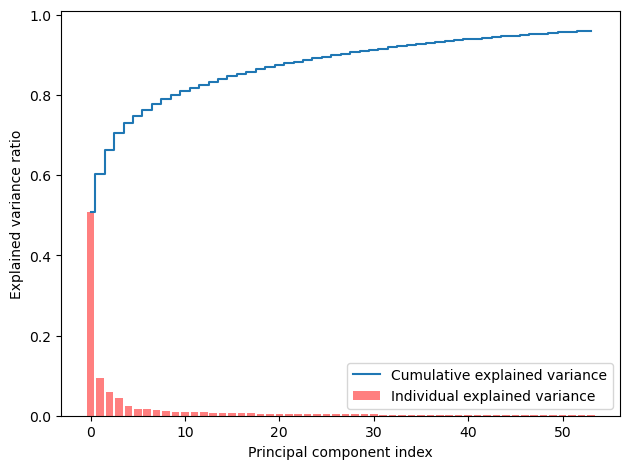

In [76]:
#https://vitalflux.com/pca-explained-variance-concept-python-example/#google_vignette

pca = PCA()
pca = PCA(n_components=.96)
#
# Determine transformed features
#
X_train_pca = pca.fit_transform(train_set)
#
# Determine explained variance using explained_variance_ration_ attribute
#
exp_var_pca = pca.explained_variance_ratio_
#
# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', color='r',label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [77]:


def encode_pca(dataset):
    pca_x_test = PCA(n_components=32)
    principalComponents_x_test = pca_x_test.fit_transform(dataset)
    if isinstance(dataset,np.ndarray):
        index = None
    else:
        index=dataset.index
    pca_x_test_ds = pd.DataFrame(data = principalComponents_x_test, 
                                       index=index)
    return pca_x_test_ds, pca_x_test

full_pca_dataset, pca_x = encode_pca(full_ds)
split_pt = int(0.7 * len(full_pca_dataset))
pca_test_dataset = full_pca_dataset[split_pt:]
pca_train_dataset = full_pca_dataset[:split_pt]

In [78]:
pca_train_dataset

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
Patient_ID,,,,,,,,,,,,,,,,,,,,,
55_control,-1.422813,0.679526,-1.131448,1.521618,-0.388621,0.486869,0.741741,1.066213,1.278283,0.527048,...,0.038902,-0.401139,0.278070,-0.088133,-0.012126,-0.127049,-0.257901,0.372943,0.167873,0.167519
168_CD_plain,0.292360,-0.982294,0.246204,0.719776,-0.591338,-0.449420,-0.667802,0.170148,-0.057905,-0.271631,...,0.161772,-0.067329,-0.216317,0.152963,0.072788,0.442977,0.033138,-0.009486,-0.149256,0.103858
72_control,-2.573907,-0.249226,0.787561,1.572788,0.332781,-0.094578,0.483419,-0.297262,-0.076362,-0.108478,...,0.235124,-0.100032,-0.365265,-0.124783,0.332609,0.096670,-0.024215,-0.091000,-0.032909,-0.141423
120_control,0.432542,-1.032328,-0.570553,-0.390323,0.375618,0.310845,-0.071708,-0.234891,-0.043078,-0.380492,...,-0.103669,-0.381894,0.157548,-0.123399,0.138679,0.065742,0.173000,0.090787,-0.489249,0.291509
258_CD_plain,-1.027262,0.051344,-0.741906,-0.486411,0.107210,0.432770,-0.317607,0.137000,-0.218172,-0.146763,...,-0.025114,-0.217852,-0.011400,0.039405,-0.020728,0.145089,0.110565,0.265051,-0.024141,0.173326
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15_CD_plain,0.476333,2.459956,2.033355,-0.001780,-0.059328,-0.351591,-0.109471,0.146075,0.442940,-0.204148,...,-0.405755,-0.040105,0.423835,0.025934,-0.057552,0.276166,-0.029568,0.006774,-0.260580,0.190662
182_CD_plain,0.923025,-1.061663,0.157899,-0.335579,-0.614594,-0.134468,0.434264,-0.055608,-0.062980,0.286778,...,0.212332,0.328577,0.136647,-0.077536,0.443385,-0.099328,-0.004247,-0.072056,0.113503,0.189936
164_CD_plain,-1.990293,1.495481,-0.863487,-0.106293,-0.320986,0.125537,0.229194,-0.013206,-0.382684,-0.196507,...,-0.124222,0.085829,0.271993,-0.199169,-0.041199,-0.017155,0.074534,-0.025589,-0.146900,-0.141659


In [79]:
# pca_train_dataset.to_csv("pca_train_dataset.csv")

In [80]:
print('Explained variation per principal component: {}'.format(pca_x.explained_variance_ratio_))
print("Total variance explained:",np.sum(pca_x.explained_variance_ratio_))

Explained variation per principal component: [0.51412454 0.08738756 0.06010116 0.04106217 0.02957726 0.01683564
 0.01472867 0.01390678 0.01122483 0.00964866 0.00876275 0.00835553
 0.00696715 0.00693605 0.00626421 0.00605512 0.00587947 0.0054997
 0.00542661 0.00512517 0.00467004 0.00449264 0.00421971 0.00395666
 0.00379601 0.00372759 0.00361638 0.00336744 0.00323469 0.00315696
 0.00305811 0.0029159 ]
Total variance explained: 0.90808117916932


### Dimensionality reduction with autoencoder

In [81]:
def load_encoder():
    n_inputs = 221
    n_bottleneck = 32
    encoder = Sequential(
                [

                    # encoder level 1
                    Dense(n_inputs*2),
                    BatchNormalization(),
                    LeakyReLU(),
                    # encoder level 2
                    Dense(n_inputs),
                    BatchNormalization(),
                    LeakyReLU(),
                    # bottleneck
                    Dense(n_bottleneck)
                ]
            )

    sh = test_set.head(1).shape
    encoder.load_weights("../data/models/cd_encoder_221")
    encoder.build(sh) 
    return encoder

In [82]:
def ae_encode_dataset(dataset):
    encoder = load_encoder()
    latent_var = np.arange(32)
    if isinstance(dataset,np.ndarray):
        recon = encoder(dataset)
        index=None
    else:
        recon = encoder(dataset.values)
        index = dataset.index
    r = pd.DataFrame(recon, columns=latent_var, index=index)
    return r
    
full_ae_dataset = ae_encode_dataset(full_ds)

split_pt = int(0.7 * len(full_ae_dataset))
ae_test_dataset = full_ae_dataset[split_pt:]
ae_train_dataset = full_ae_dataset[:split_pt]

In [83]:
ae_train_dataset

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
Patient_ID,,,,,,,,,,,,,,,,,,,,,
55_control,2.596502,2.430939,2.010167,1.988170,-0.236424,0.738195,-1.470155,1.283382,-0.728870,-0.052710,...,-1.691154,-1.328782,4.721321,4.368073,-1.815750,2.508918,0.785515,-1.037885,-0.455860,0.352290
168_CD_plain,-0.169194,0.164325,-0.353830,0.265289,-1.070708,-0.316918,-0.232851,1.325479,-0.767969,-0.247391,...,1.227687,1.764788,0.752974,-0.504321,0.841872,1.387819,-2.367767,-0.634869,0.698864,1.668452
72_control,1.168367,-0.259255,-2.850679,2.838480,-0.400903,4.422839,0.081115,-5.722720,1.407777,3.747684,...,-0.574361,-4.133078,0.609514,6.524243,-1.553982,1.433792,3.026420,1.136814,-0.676861,3.254258
120_control,0.521611,-0.543107,0.271438,0.080197,0.690557,-1.804082,0.261246,3.479921,0.279841,-1.592950,...,1.946366,2.746249,-0.756204,-1.392635,1.400571,-0.907319,-1.370310,-1.559054,0.749926,0.801282
258_CD_plain,-0.496644,-0.047504,1.558083,1.018557,-0.163167,-0.619521,-1.261889,1.516978,0.402559,0.990199,...,1.269593,0.435646,-0.006180,1.589914,-0.064623,1.156240,0.634446,-1.661841,-0.397186,0.013347
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15_CD_plain,-3.409775,2.056466,-2.165126,-1.190497,-0.689161,3.060941,2.053582,-5.749561,-0.054048,4.353191,...,-4.930549,-2.767142,-1.623984,-0.923868,-1.026869,1.559720,4.206764,0.511516,1.506572,-1.905900
182_CD_plain,0.406833,0.037590,0.400895,-0.901879,0.719415,-1.380366,0.737852,2.094096,0.762147,-1.884177,...,1.417340,2.168235,-0.566314,-2.397901,1.118950,-0.949135,-2.887945,-0.061070,1.171145,1.382351
164_CD_plain,0.627015,1.783259,2.119554,2.353254,-0.244750,0.794345,-2.476260,-2.135139,0.362110,2.333287,...,-1.387385,-2.106357,0.997186,3.680473,-2.281251,2.360896,2.523493,-0.603643,-0.341531,-0.022073


## True labels

In [84]:
train_patient_ids = np.array(pca_train_dataset.index)


In [85]:
test_patient_ids = np.array(pca_test_dataset.index)


In [86]:
def classify(x):
    if "_control" in x: # control
        return 0
    elif "CD_plain" in x: # Crohn's Disease no deep ulcer
        return 1
    elif "CD_deep_ulcer" in x: # Crohn's Disease deep ulcer
        return 2
    else:
        return 3 # Ulcerative Collitis

vec = np.vectorize(classify)

train_disease_labels = vec(train_patient_ids)
test_disease_labels = vec(test_patient_ids)

In [87]:
import matplotlib.pyplot as plt

from matplotlib.ticker import NullFormatter
from sklearn import manifold, datasets
from time import time

## KMeans clustering

### Training

In [88]:
def train_kmeans(full_dataset, perplexity):
    # reduce to 2D with tSNE
    tsne = manifold.TSNE(
        n_components=2,
        init="random",
        random_state=0,
        perplexity=perplexity,
        n_iter=750,
        method='exact'
    )
    X = tsne.fit_transform(full_dataset)
    X_test = X[split_pt:]
    X_train = X[:split_pt]

    num_c=4
    kmeans = KMeans(num_c, random_state=0).fit(X_train)
    k_labels_train = kmeans.predict(X_train)
    k_labels_test = kmeans.predict(X_test)


    # representation of the KMeans model (both)
    centers = kmeans.cluster_centers_
    radii = [cdist(X_train[k_labels_train == i], [center]).max()
             for i, center in enumerate(centers)]
    
    return kmeans, X_train, X_test, k_labels_train, k_labels_test, centers, radii

## Process KMeans models

In [89]:
def get_count_matrix_km(kmeans, X_train, train_disease_labels):

    
    # make matrix to record number of each class in each cluster
    amounts = np.zeros((3, num_c))
    
    
    classes = ["control", "CD_no_ulcer", "CD_deep_ulcer"]
    centers = kmeans.cluster_centers_
    for c, cls in enumerate(classes):
        for pt in X_train[train_disease_labels==c]:
            pt = pt.reshape(1,-1)
            distances = cdist(centers, pt, 'euclidean')
            closest_cluster = np.argmin(distances)
            amounts[c][closest_cluster] += 1
    

    #                cluster 0, cluster 1, cluster 2, cluster 3
    # control 
    # CD no ulcer
    # CD deep ulcer
    
    return amounts

In [90]:
def pair_repeat(dup, cls_assignments, num_c, amounts):
    all_clusters = np.arange(num_c)
    # replace one of the duplicates with max of remaining clusters
    replace_class = np.where(cls_assignments == dup[0])[0][0]
    rem_cluster_a, rem_cluster_b = np.setdiff1d(all_clusters,cls_assignments)
    if amounts[replace_class][rem_cluster_a] > amounts[replace_class][rem_cluster_b]:
        cls_assignments[replace_class] = rem_cluster_a
    else:
        cls_assignments[replace_class] = rem_cluster_b
        
    return cls_assignments

def handle_duplicates(cls_assignments, dup, c, num_c, amounts):
    if len(c) != 1:
        
        cls_assignments = pair_repeat(dup, cls_assignments, num_c, amounts)
    else:
        # reassign class least associated to next most associated cluster
        given_cluster = dup[0]
        cls_least = np.argmin(amounts[:,given_cluster])
        class_amounts = amounts[cls_least,:]
        class_amounts[given_cluster] = -1
        next_cluster = np.argmax(class_amounts)
        cls_assignments[cls_least] = next_cluster
        
        # handle other duplicate pair
        u, c = np.unique(cls_assignments, return_counts=True)
        dup = u[c > 1]
        cls_assignments = pair_repeat(dup, cls_assignments, num_c, amounts)

    return cls_assignments

In [91]:

    
def process_clusters(amounts, X_train, num_c):
    all_clusters = np.arange(num_c)

    
    cls_assignments = np.argmax(amounts, axis=1) # assigned to class 0, 1, 2
    
    # check for and handle duplicates
    u, c = np.unique(cls_assignments, return_counts=True)
    dup = u[c > 1]
    if len(dup) > 0:
        cls_assignments = handle_duplicates(cls_assignments, dup, c, num_c, amounts)
        
            
    class_assignment_amounts = np.max(amounts, axis=1) 
    
    assignments = [None] * 3
    
    assigned = 0
    while assigned < num_c - 1:
        curr_max_class = np.argmax(class_assignment_amounts)
        assigned_cluster = cls_assignments[curr_max_class]
        if assignments[curr_max_class] is None:
            assignments[curr_max_class] = [assigned_cluster]
        else:
            assignments[curr_max_class].append(assigned_cluster)
        class_assignment_amounts[curr_max_class] = -1
        assigned += 1

    # Assign remaining cluster
    
    rem_cluster = np.setdiff1d(all_clusters,cls_assignments)[0]
    
    rem_cls_assignment = np.argmax(amounts[:,rem_cluster], axis=0)
    assignments[rem_cls_assignment].append(rem_cluster)
    couple = assignments[rem_cls_assignment]
    # clusters assigned to disease class 0, 1, 2 (control, CD_no_ulcer, CD_deep_ulcer)
    
    return assignments, couple

In [92]:
def get_class_from_label(label, couple, assignments):
    if label in couple:
        search_term = couple
    else:
        search_term = [label]
    try:
        cls = assignments.index(search_term)
    except:
        return None
    return cls


In [93]:
def get_final_clusters(assignments, couple, labels):
    test_set_clusters = []
    for label in labels:
        cls = get_class_from_label(label, couple, assignments)
        test_set_clusters.append(cls)

    test_set_clusters = np.array(test_set_clusters)
    return test_set_clusters

## Gaussian Mixture Models

In [94]:

from matplotlib.patches import Ellipse
from sklearn import mixture

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))
        


## Process GMM cluster models

In [95]:
num_c = 4


def fit_gmm(full_dataset, perplexity, num_c, split_pt=None):
    gmm = mixture.GaussianMixture(n_components=num_c,covariance_type='full', random_state=42)
    tsne = manifold.TSNE(
        n_components=2,
        init="random",
        random_state=0,
        perplexity=perplexity,
        n_iter=750,
        method='exact'
    )
    X = tsne.fit_transform(full_dataset)
    
    if split_pt is None:
        split_pt = int(0.7*len(full_dataset))
        split_pt_val = int(0.85*len(full_dataset))
        X_test = X[split_pt_val:]
        X_val = X[split_pt:split_pt_val]
    else:
        X_val = None
        X_test = X[split_pt:]
    X_train = X[:split_pt]
    gmm.fit(X_train)
    
    return gmm, X_train, X_test, X_val

In [96]:
import scipy.stats
from scipy.stats import multivariate_normal


In [97]:
def get_amount_matrix_gmm(gmm, X_train, train_disease_labels):
    mu, covar, w = gmm.means_, gmm.covariances_, gmm.weights_
    
    comps = [multivariate_normal(mu[i], covar[i]) for i in range(num_c)]
    
    # make matrix to record amount of each class in each mixture component
    amounts = np.zeros((3, num_c))
    
    
    classes = ["control", "CD_no_ulcer", "CD_deep_ulcer"]
    for c, cls in enumerate(classes):
        for i, comp in enumerate(comps): # add up contributions for each component
            weight = w[i]
            pts = X_train[train_disease_labels==c]
            curr_sum = np.sum(comp.pdf(pts)) * weight
            amounts[c][i] = curr_sum
    #                cluster 0, cluster 1, cluster 2, cluster 3
    # control 
    # CD no ulcer
    # CD deep ulcer
    
    return amounts

In [98]:
def final_gmm_model_get_clusters(gmm, X_train, X_test, train_disease_labels):
    # process
    amounts = get_amount_matrix_gmm(gmm, X_train, train_disease_labels)
    assignments, couple = process_clusters(amounts, X_train, num_c)
    # retrieve clusters
    gmm_labels = gmm.predict(X_test)
    test_set_clusters = get_final_clusters(assignments, couple, gmm_labels)
    
    return test_set_clusters



### Apply resulting models to test sets

In [99]:
# perplexity = 24
gmm_pca, X_train_pca, _, X_test_pca = fit_gmm(full_pca_dataset, 160, num_c)
gmm_ae, X_train_ae, _, X_test_ae = fit_gmm(full_ae_dataset, 130, num_c)


In [100]:
# gmm_labels_list = [gmm_labels_ae, gmm_labels_pca]
gmm_models_list = [gmm_ae, gmm_pca]
train_set_list = [X_train_ae, X_train_pca]
test_set_list = [X_test_ae, X_test_pca]


C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.add_patch(Ellipse(position, nsig * width, nsig * height,
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: Matplotl

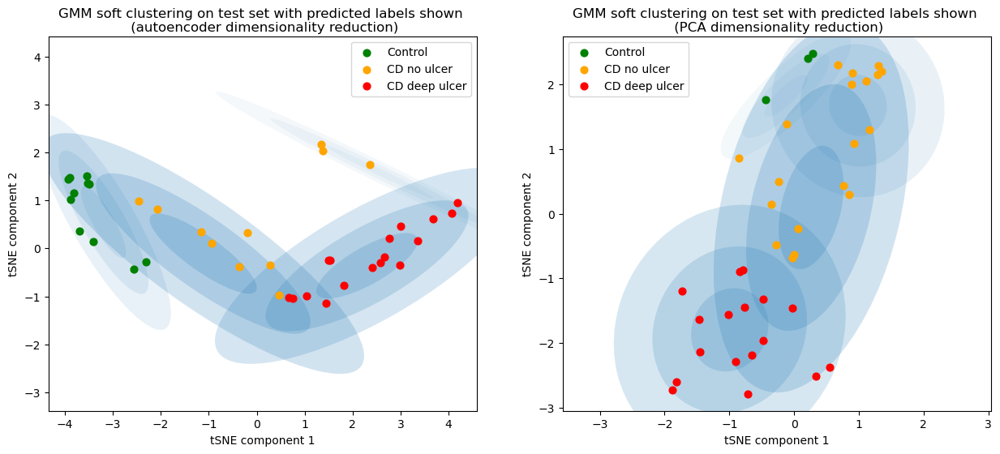

In [101]:
def plot_final_gmm_models(gmm_models_list, train_set_list, test_set_list, num_c, selected_patient_idx=None):

    (fig, subplots) = plt.subplots(1, 2, figsize=(15, 6))
    reduction = ["autoencoder", "PCA"]
    final_clusters_lst = []
    for i in range(len(gmm_models_list)):
        ax = subplots[i]
        gmm = gmm_models_list[i]
        X_train = train_set_list[i]
        X_test = test_set_list[i]

        test_set_clusters = final_gmm_model_get_clusters(gmm, X_train, X_test, train_disease_labels)

        final_clusters_lst.append(test_set_clusters)




        reduc = reduction[i]
        num_clusters = 3
        cluster_names = ["Control", "CD no ulcer", "CD deep ulcer"]
        colours = ["green", "orange", "red"]
        ax.set_title("GMM soft clustering on test set with predicted labels shown \n (" + reduc + " dimensionality reduction)",
                    wrap=True)

        for i in range(num_clusters):
            ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2) 

        ax.axis('equal')


        w_factor = 0.2 / gmm.weights_.max()
        for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
            draw_ellipse(pos, covar, alpha=w * w_factor, ax=ax)
        
        
        if selected_patient_idx is not None:
            ax.scatter(X_test[selected_patient_idx, 0], X_test[selected_patient_idx, 1], c="cyan", s=500, marker='*',edgecolor='black', linewidth=.7, label="Selected patient", zorder=2)
        ax.legend()
        ax.set_xlabel("tSNE component 1")
        ax.set_ylabel("tSNE component 2")
    plt.show()


    return final_clusters_lst
        
final_clusters_gmm_ae, final_clusters_gmm_pca = plot_final_gmm_models(gmm_models_list, train_set_list, test_set_list, num_c)

# Class contrastive explainability

## Gene expression distributions of test set (post scaling)

In [102]:
hundred_control = x_test_scaled.loc[x_test_scaled.index.str.endswith('_control')]
hundred_CD_plain = x_test_scaled.loc[x_test_scaled.index.str.endswith('_CD_plain')]
hundred_CD_deep_ulcer = x_test_scaled.loc[x_test_scaled.index.str.endswith('_CD_deep_ulcer')]
datasets = [hundred_control, hundred_CD_plain, hundred_CD_deep_ulcer]
labels = ["Control", "Crohn's Disease No Ulcer", "Crohn's Disease Deep Ulcer"]
colours = ["green", "orange", "red"]

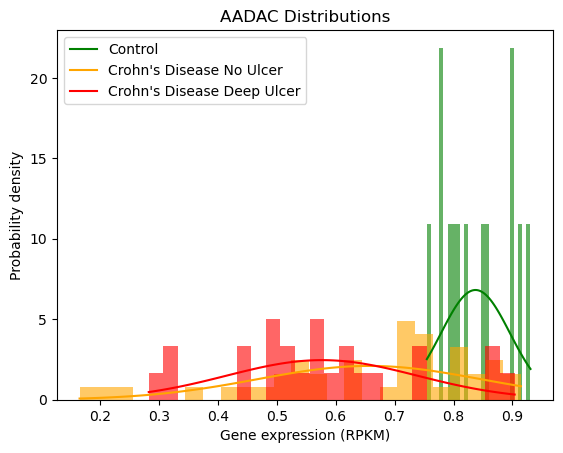

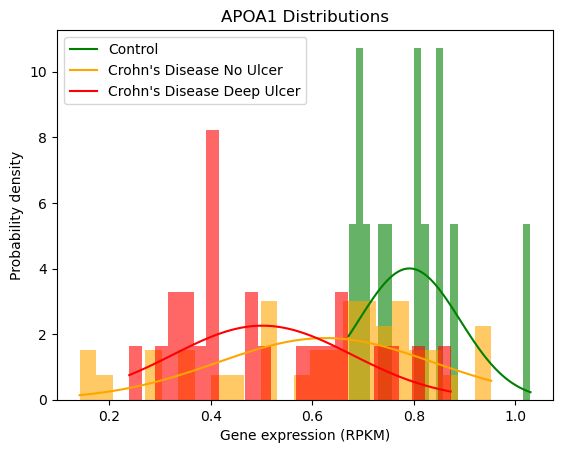

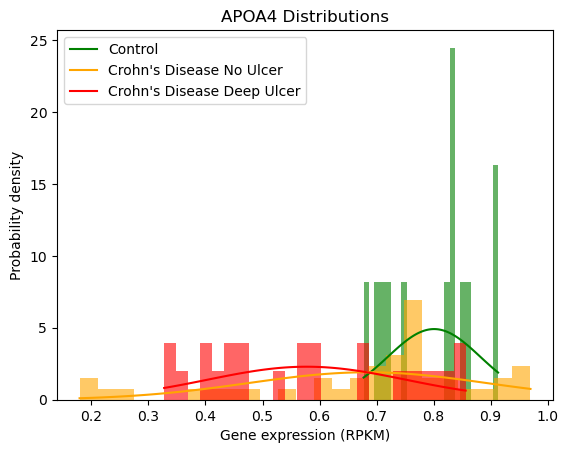

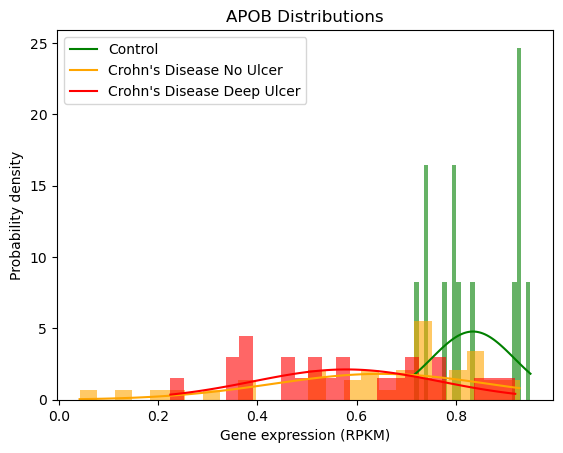

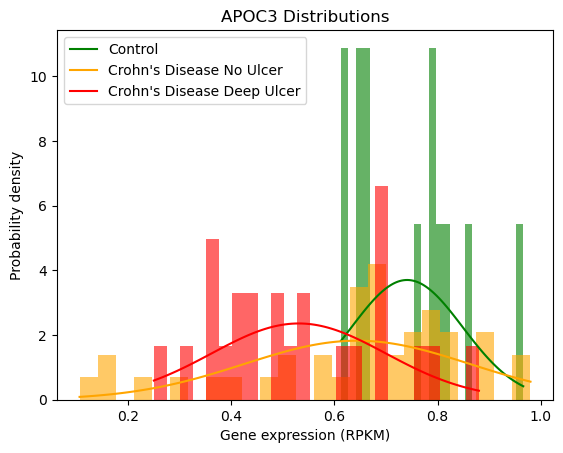

...

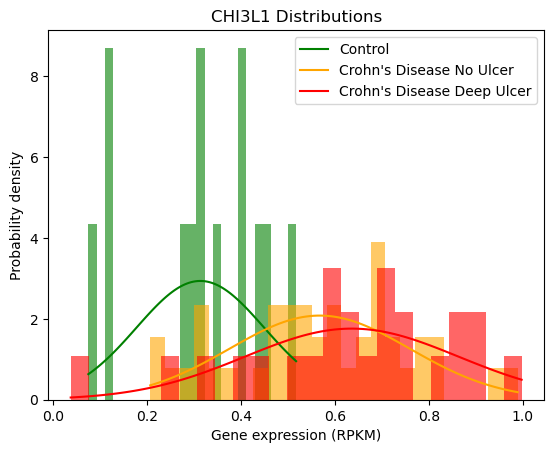

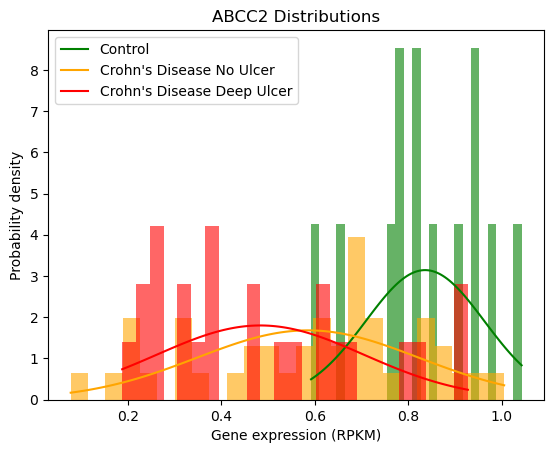

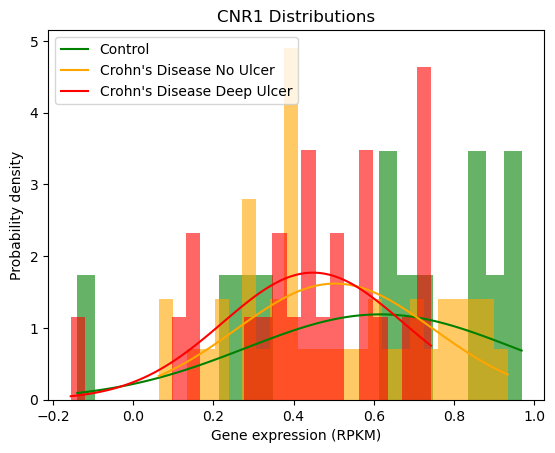

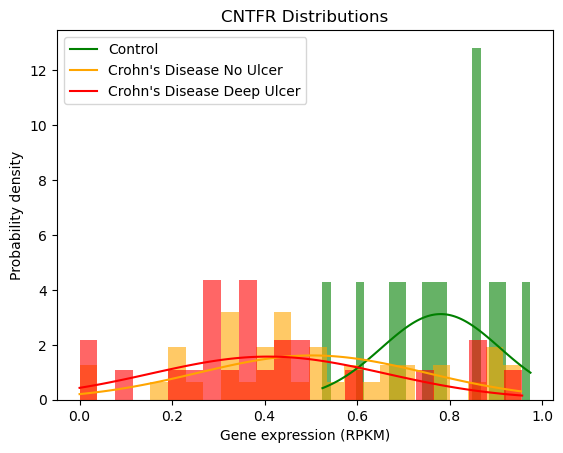

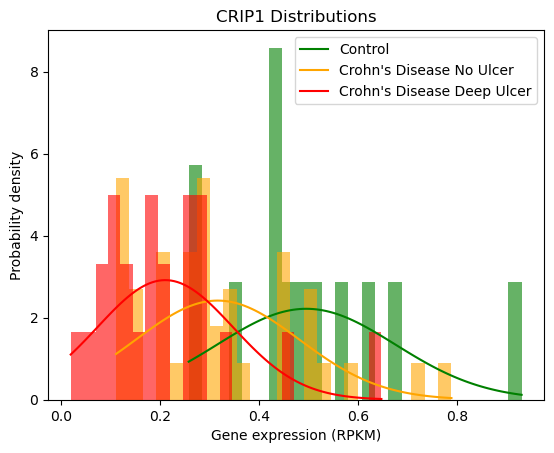

C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


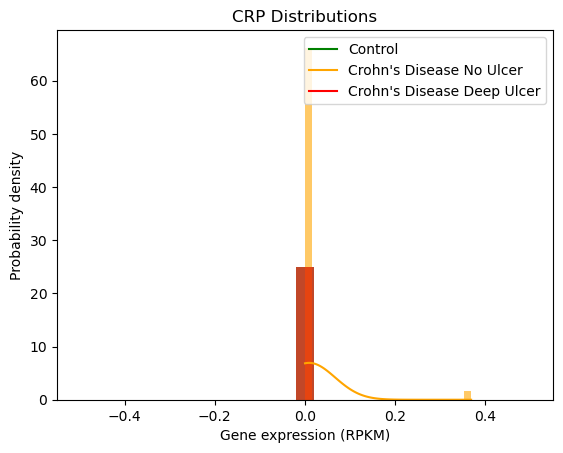

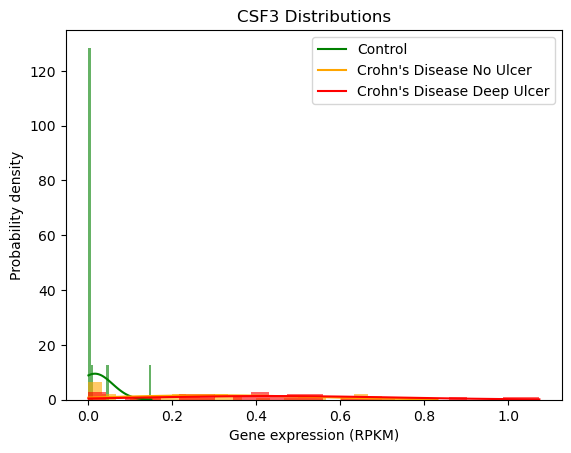

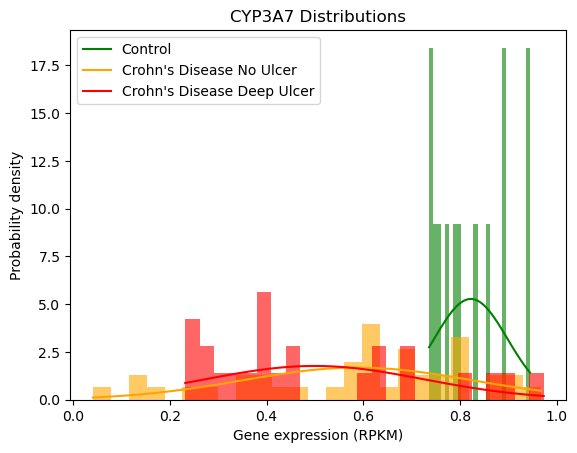

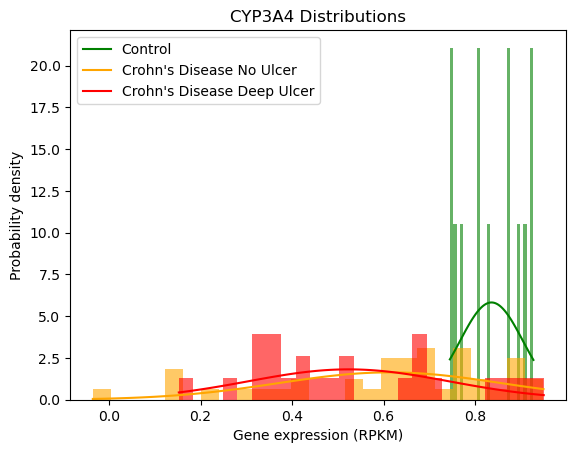

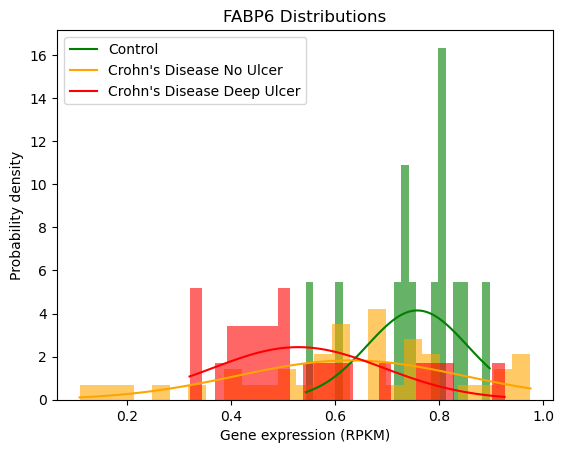

...

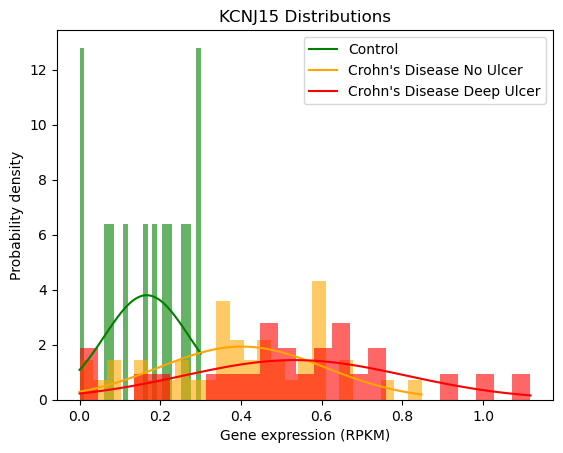

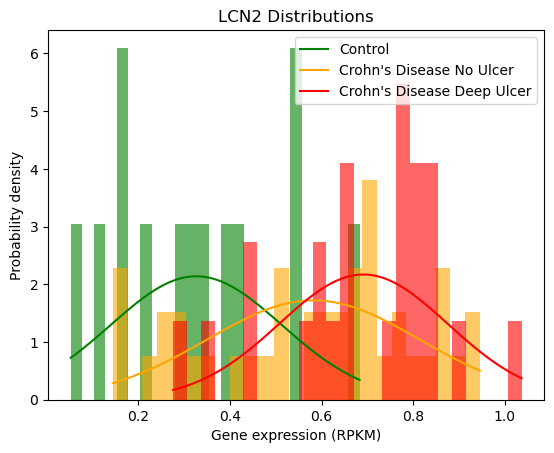

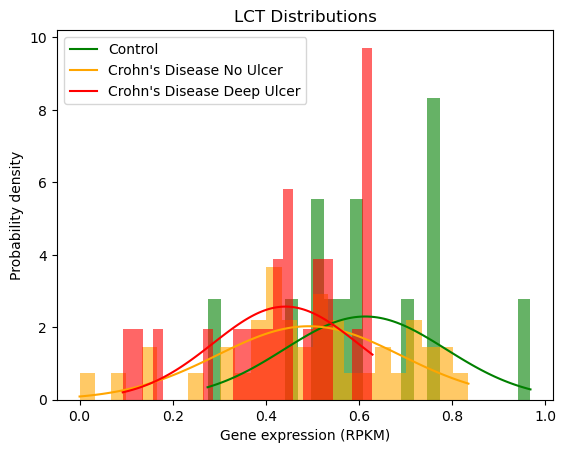

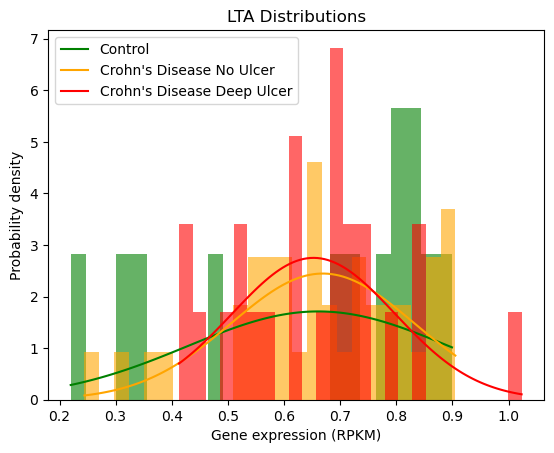

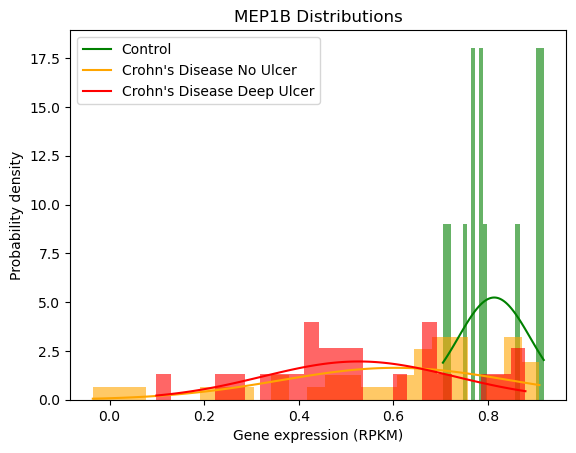

C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


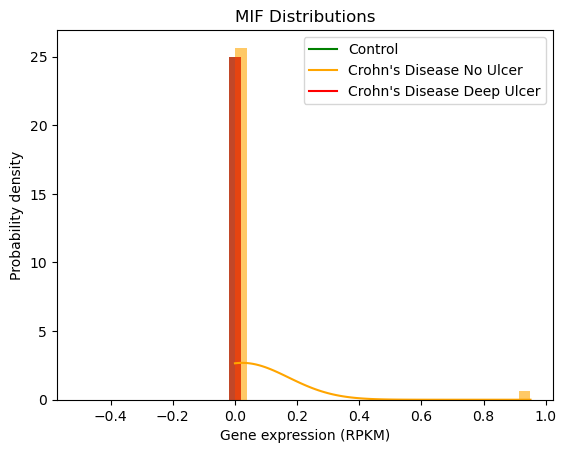

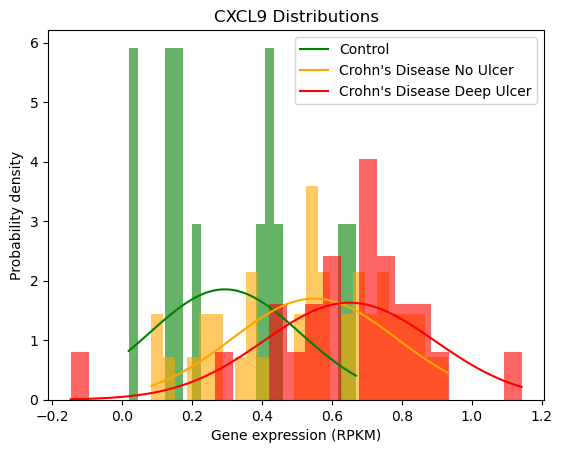

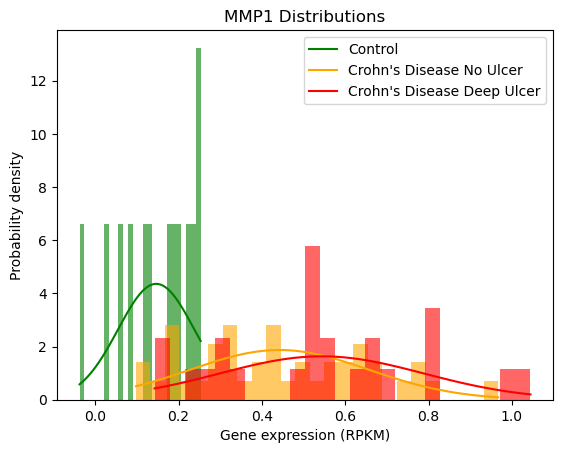

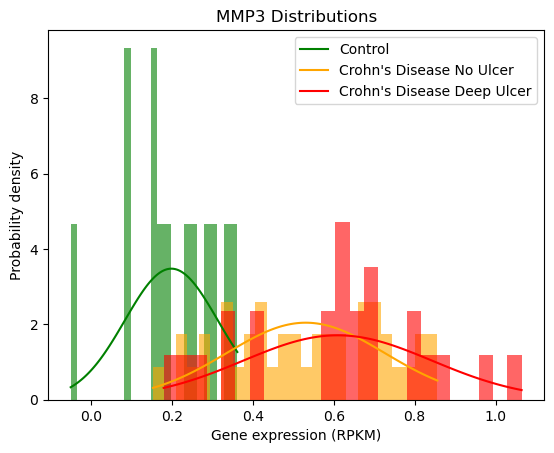

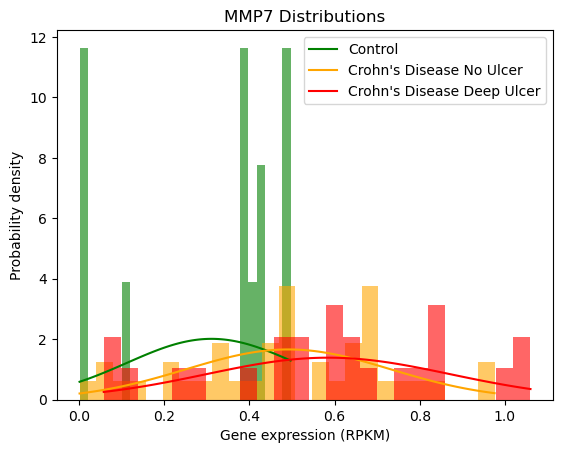

...

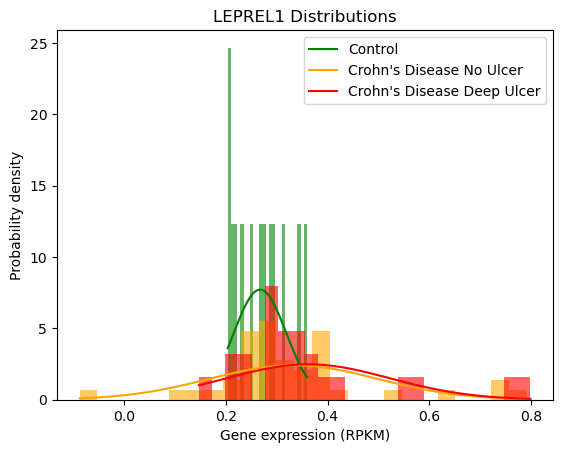

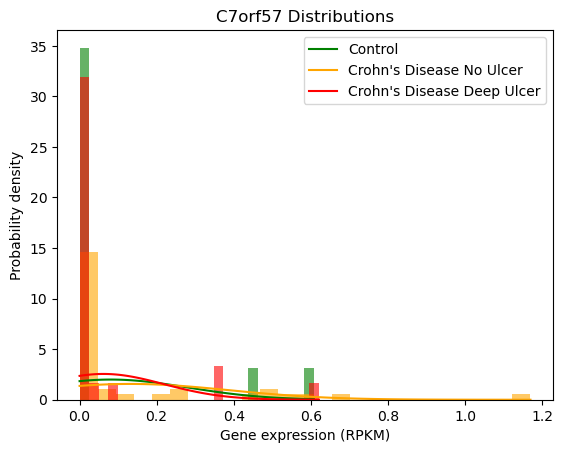

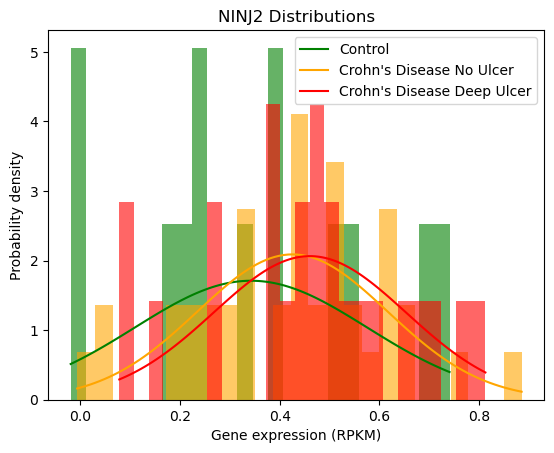

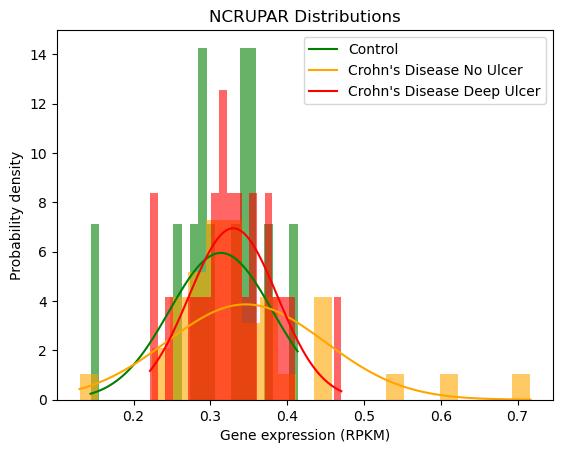

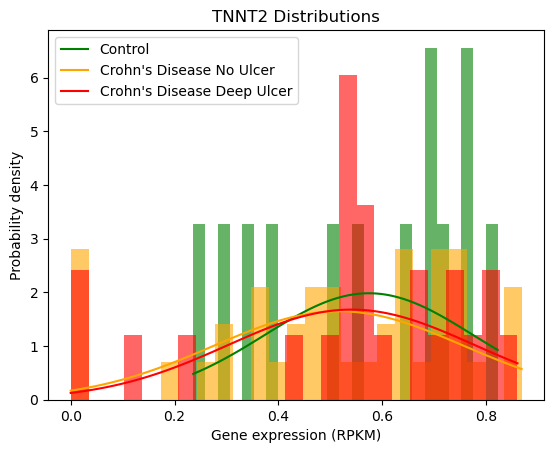

C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


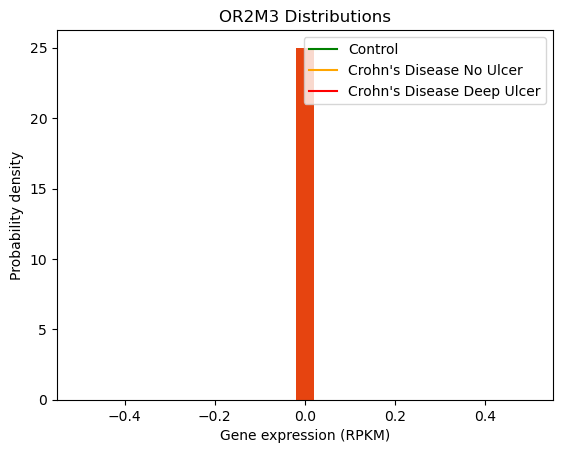

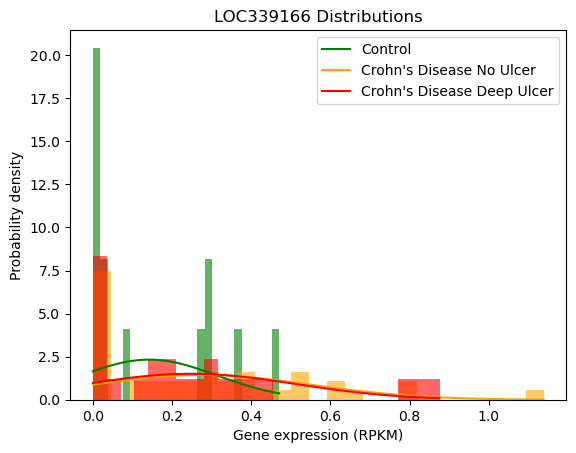

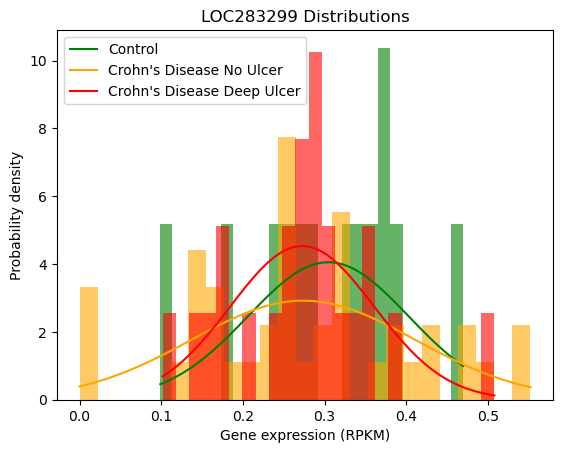

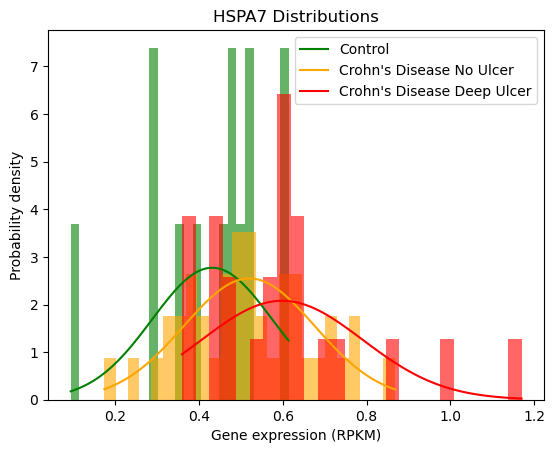

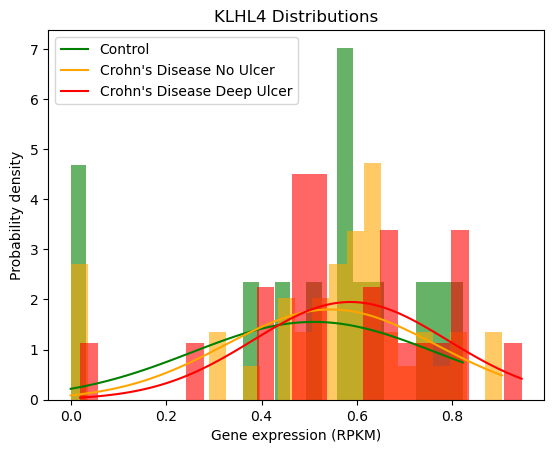

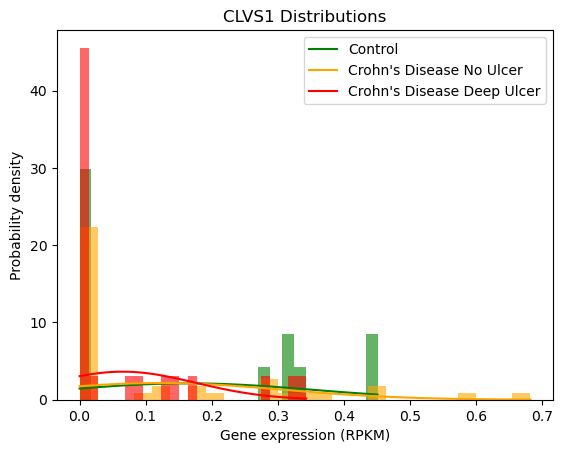

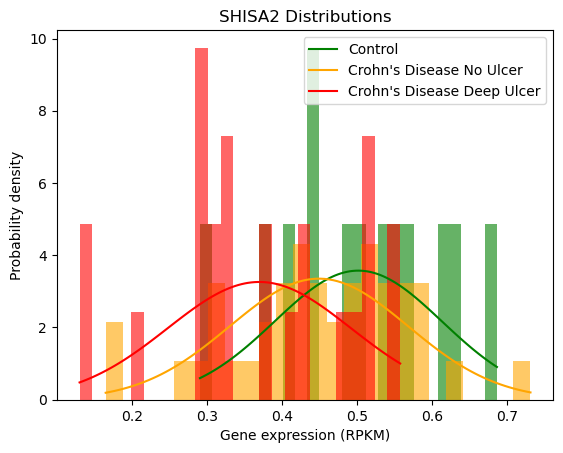

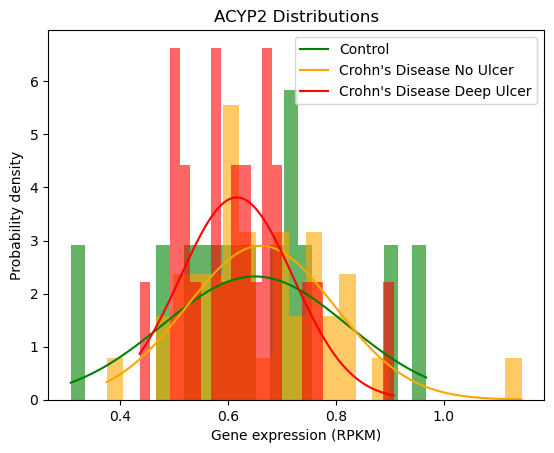

C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


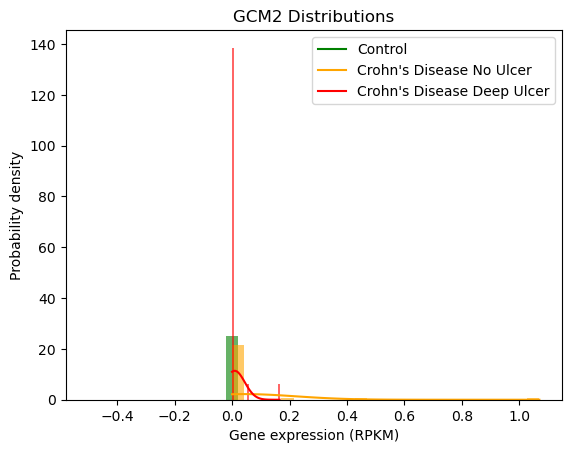

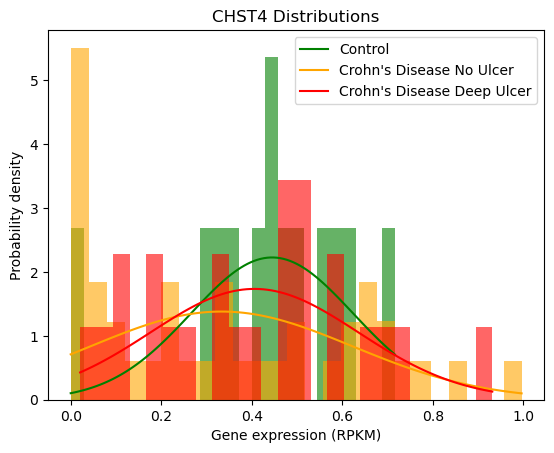

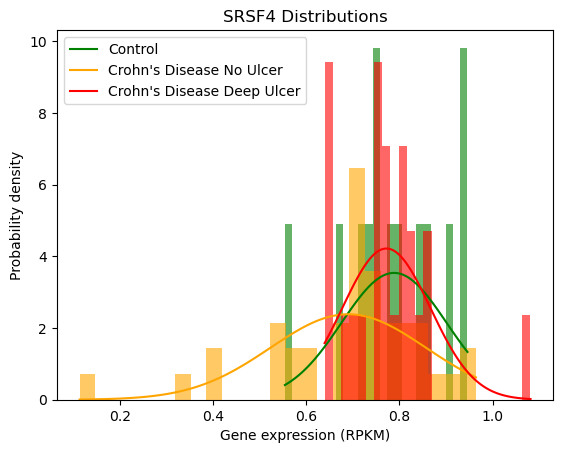

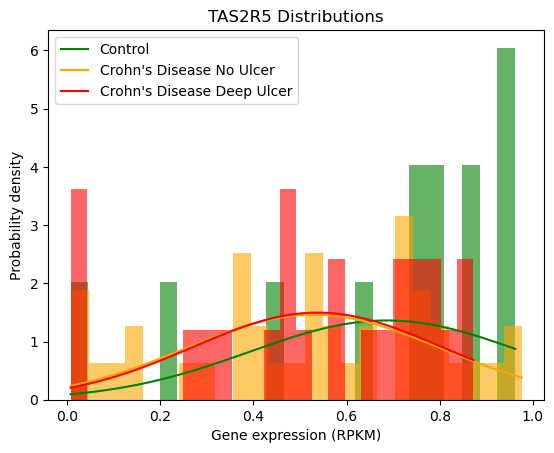

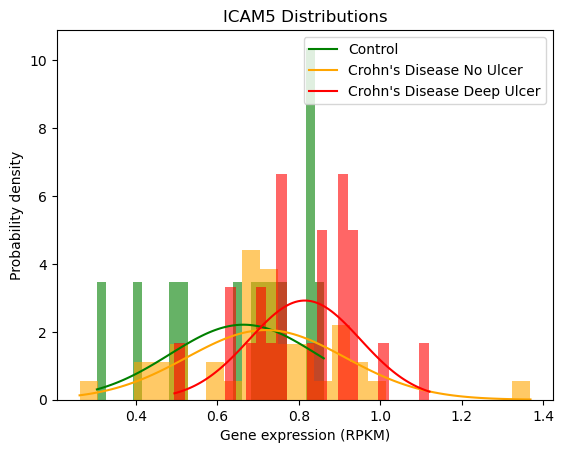

...

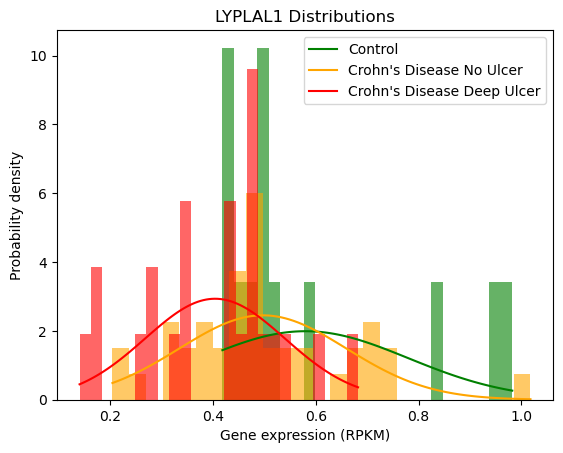

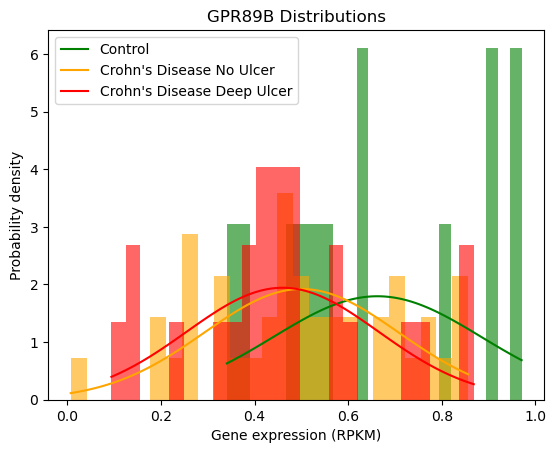

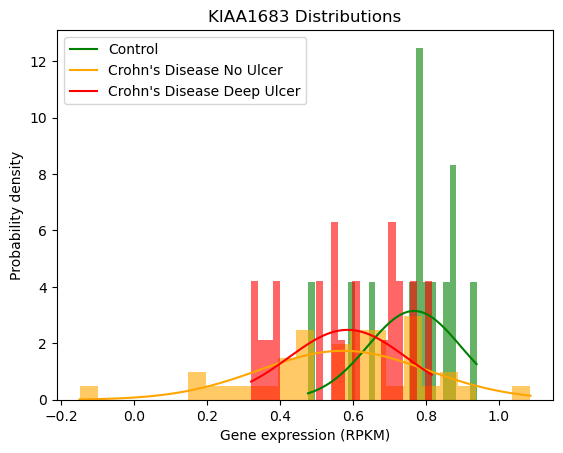

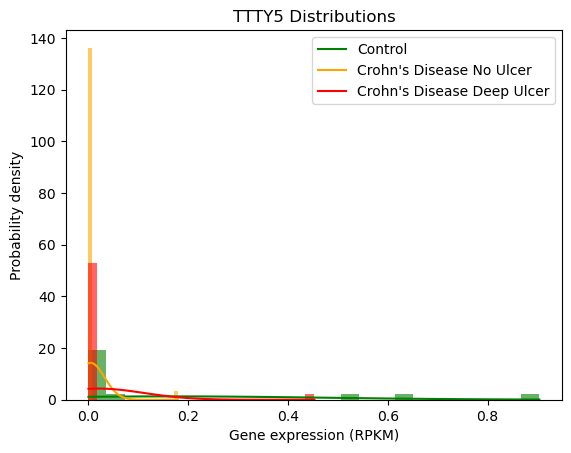

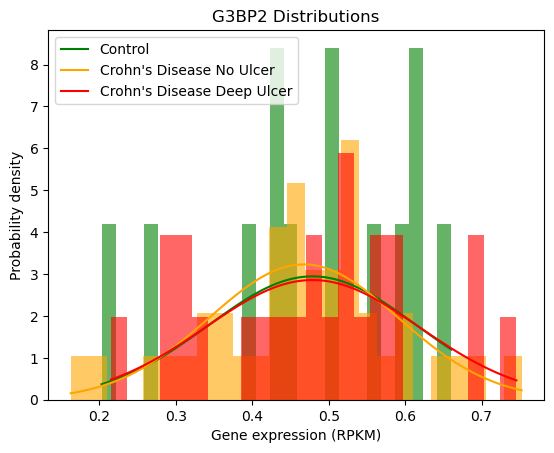

C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


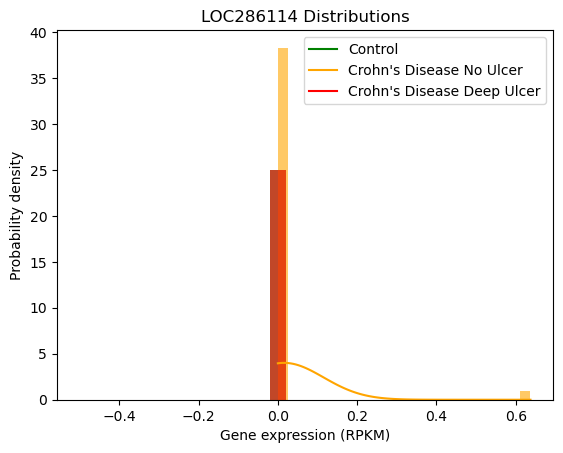

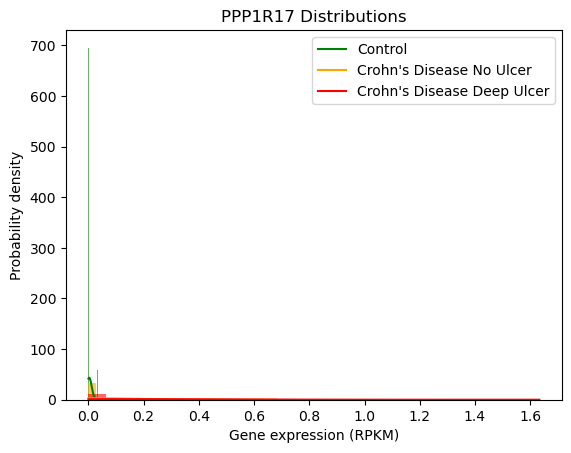

C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


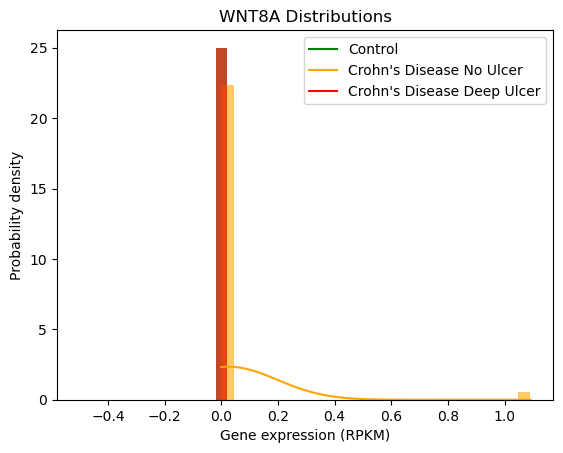

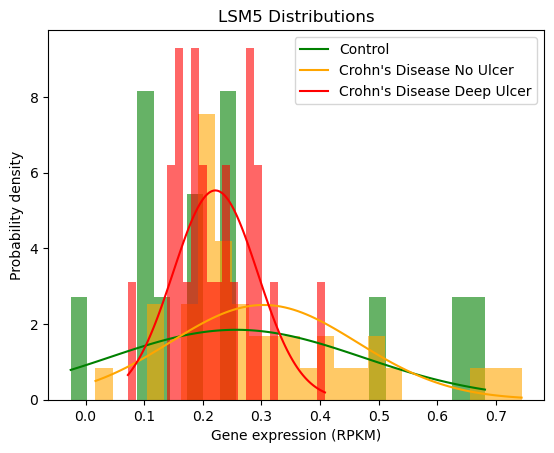

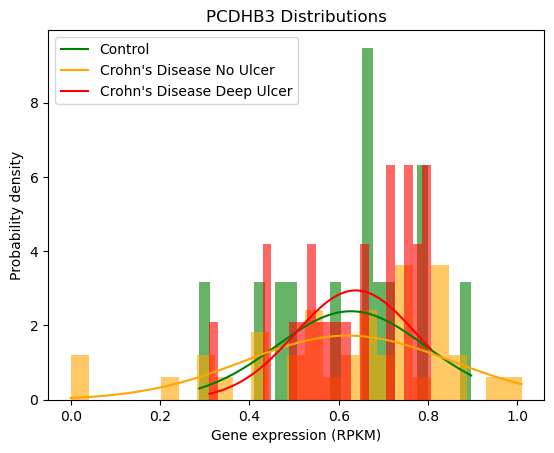

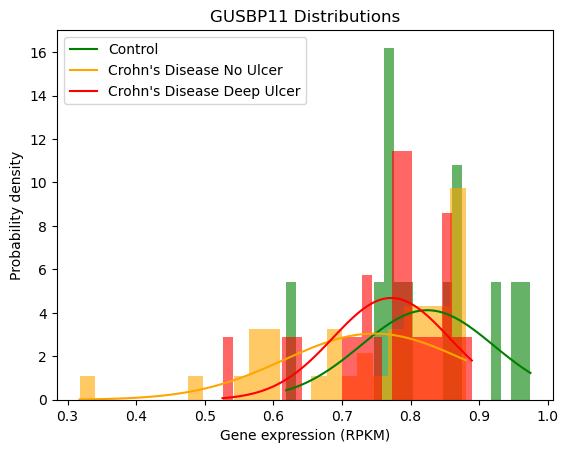

C:\Users\shard\anaconda3\envs\mvp4\lib\site-packages\scipy\stats\_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


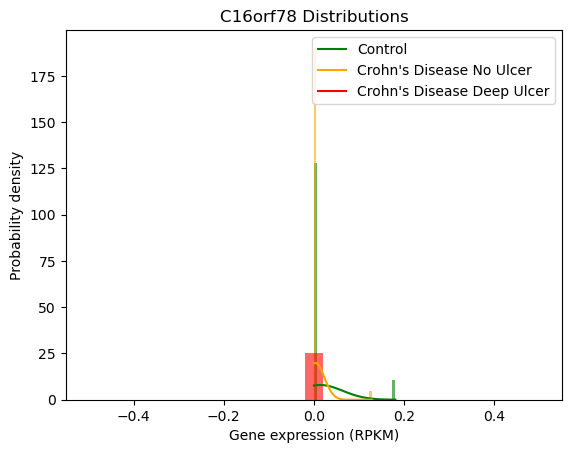

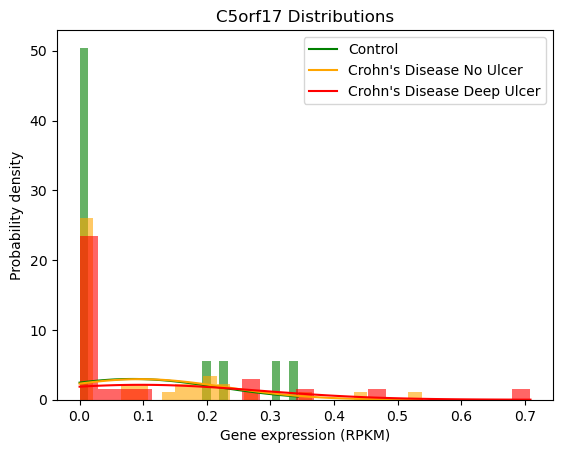

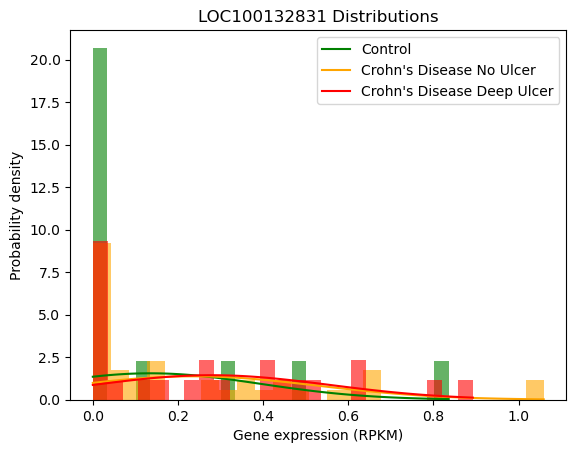

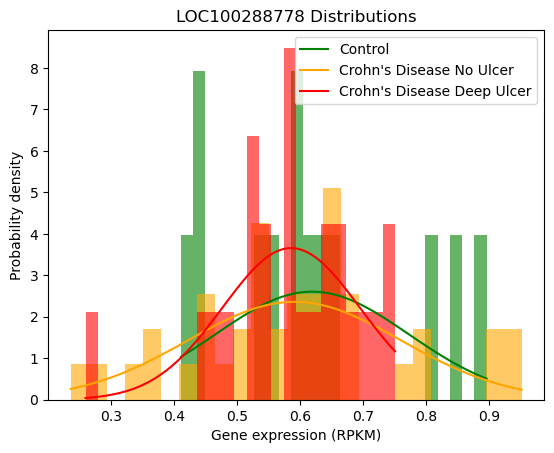

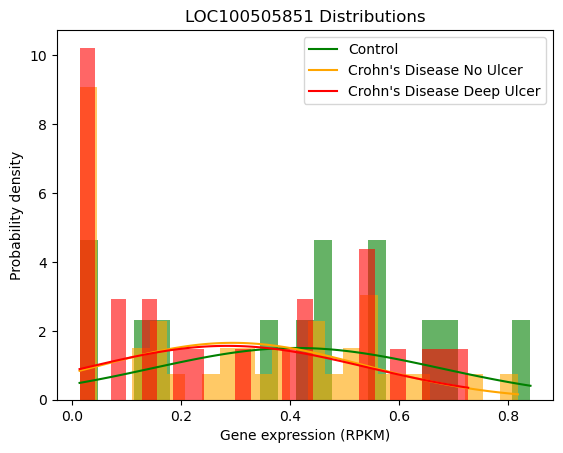

In [103]:
import matplotlib.pyplot as plt
import scipy.stats as stats
import math

for gene_symbol in hundred_control.columns:
    for i in range(len(datasets)):
        ds = datasets[i]
        label = labels[i]
        colour = colours[i]
        vals = ds[gene_symbol].values
        gene_stats = ds.describe()
        g_mean = gene_stats.loc["mean", gene_symbol]
        g_std = gene_stats.loc["std", gene_symbol]
        g_min = gene_stats.loc["min", gene_symbol]
        g_max = gene_stats.loc["max", gene_symbol]

        mu = g_mean
        variance = g_std**2
        sigma = math.sqrt(variance)
        x = np.linspace(g_min, g_max, 100)
        plt.plot(x, stats.norm.pdf(x, mu, sigma), label=label, c=colour)

        if i<4:
            plt.hist(vals, bins=25, density=True, alpha=0.6, color=colour)
    plt.title(gene_symbol+" Distributions")
    plt.xlabel('Gene expression (RPKM)')
    plt.ylabel('Probability density')
    plt.legend()
    plt.show()

## GMM Explainability - CD Deep Ulcer patient

In [104]:
def get_patient(test_set, symptom, frac=4):
    poss_patients = test_set.loc[test_set.index.str.endswith(symptom)]
    selected_patient = poss_patients.iloc[[len(poss_patients)//frac]]
    pid = selected_patient.index[0]
    return selected_patient, pid

selected_patient, pid = get_patient(test_set, 'CD_deep_ulcer')
selected_patient

,AADAC,APOA1,APOA4,APOB,APOC3,AQP9,C6,CEACAM7,CHI3L1,ABCC2,...,PPP1R17,WNT8A,LSM5,PCDHB3,GUSBP11,C16orf78,C5orf17,LOC100132831,LOC100288778,LOC100505851
Patient_ID,,,,,,,,,,,,,,,,,,,,,
46_CD_deep_ulcer,0.438089,0.482152,0.410237,0.378247,0.438691,0.705762,0.339106,0.559666,0.878088,0.228893,...,0.0,0.0,0.286687,0.790656,0.525861,0.0,0.0,0.0,0.260092,0.394684


In [105]:
pid

'46_CD_deep_ulcer'

In [106]:
ind = test_set.index
selected_patient_idx = ind.get_loc(pid)
selected_patient_idx

18

C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.add_patch(Ellipse(position, nsig * width, nsig * height,
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: Matplotl

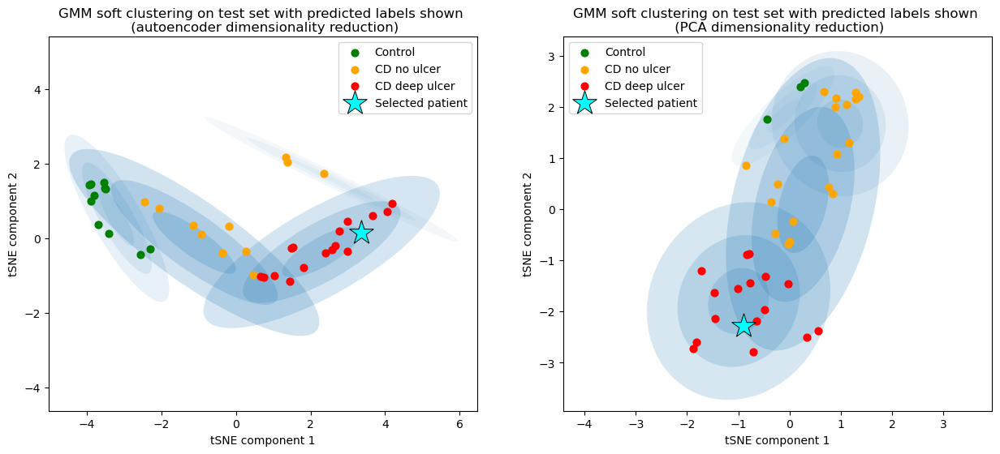

In [107]:
ret = plot_final_gmm_models(gmm_models_list, train_set_list, test_set_list, num_c, selected_patient_idx=selected_patient_idx)

Initial position of patient in clustering model

### Modify gene expressions for the selected patient - 117/221 genes

In [108]:
test_set = x_test_scaled.copy()
full_ds = full_ds.copy()

In [109]:
def re_encode(dataset, num_c, reduction_type):
    gmm = mixture.GaussianMixture(n_components=num_c,covariance_type='full', random_state=42)
    if reduction_type == "PCA":
        red_dataset, _ = encode_pca(dataset)
        perp = 150
    else:
        red_dataset = ae_encode_dataset(dataset)
        perp = 130
    tsne = manifold.TSNE(
        n_components=2,
        init="random",
        random_state=0,
        perplexity=perp,
        n_iter=750,
        method='exact'
    )
    X = tsne.fit_transform(red_dataset)
    X_test = X[split_pt:]
    X_train = X[:split_pt]
    gmm.fit(X_train)
    
    return gmm, X_train, X_test

In [110]:
with open("../data/deep_117.txt", "r") as f:
    genes = f.read().splitlines()
most_sig_set = np.array(genes)
most_sig_set

array(['IRGM', 'MIF', 'TIMM50', 'WNT8A', 'GCM2', 'LOC283299', 'C7orf57',
       'CEACAM7', 'LOC339166', 'REG1P', 'LOC286114', 'LOC100505851',
       'PPP1R17', 'NCRUPAR', 'PGC', 'SELE', 'CRP', 'PROK2', 'FPR1',
       'LOC147646', 'HCAR3', 'NAT8', 'FPR2', 'CXCL9', 'TREM1', 'CLEC5A',
       'BPIFB1', 'FRMD1', 'OTOP2', 'SUSD2', 'OSM', 'IL10RA', 'LCT',
       'FOLH1B', 'NOD2', 'FCGR1A', 'FCRL3', 'EFNB1', 'HSD11B1', 'APOC3',
       'CSF3', 'XPNPEP2', 'CHI3L1', 'CXCR2', 'REG1A', 'IL1RN',
       'LOC392364', 'IL10', 'CXCL6', 'FCN1', 'LYPD1', 'SLC6A4',
       'C16orf78', 'RGS13', 'C19orf59', 'LEPREL1', 'PCDHB3', 'CPO',
       'TCF4', 'PUM2', 'SLC28A2', 'SLC22A4', 'FDCSP', 'CHST4', 'LATS2',
       'DUOXA2', 'HSPA7', 'LOC100506115', 'FHIT', 'CYP3A7', 'EGFL6',
       'MGAM', 'SLC22A5', 'CLVS1', 'OR2M3', 'LYPLAL1', 'IL1B', 'CRIP1',
       'IL12B', 'MUC2', 'TTTY5', 'CLDN8', 'SLC6A14', 'AADAC', 'STAT1',
       'SLC5A4', 'C5orf17', 'MUC1', 'TM4SF19', 'SAA1', 'GUCA2B',
       'LOC100132831', 'SRSF4', 

In [111]:
def modify_expression(pid, most_diff_genes, dataset):
    controls = dataset.loc[dataset.index.str.endswith('_control')]
    
    for gene_symbol in most_diff_genes:
        new_val = controls.describe().loc["mean", gene_symbol]
        dataset.loc[dataset.index.str.startswith(pid), gene_symbol] = new_val
    return dataset


In [112]:
test_set = modify_expression(pid, most_sig_set, test_set)
test_set.loc[test_set.index.str.startswith(pid)]

,AADAC,APOA1,APOA4,APOB,APOC3,AQP9,C6,CEACAM7,CHI3L1,ABCC2,...,PPP1R17,WNT8A,LSM5,PCDHB3,GUSBP11,C16orf78,C5orf17,LOC100132831,LOC100288778,LOC100505851
Patient_ID,,,,,,,,,,,,,,,,,,,,,
46_CD_deep_ulcer,0.837271,0.482152,0.410237,0.378247,0.740914,0.705762,0.339106,0.173455,0.313654,0.836045,...,0.002552,0.0,0.286687,0.627288,0.525861,0.013901,0.083511,0.13522,0.260092,0.411942


In [113]:
full_ds[-len(test_set):] = test_set

### Re-encode and refit models

In [114]:
gmm_pca, X_train_pca, X_test_pca = re_encode(full_ds, num_c, "PCA")
gmm_ae, X_train_ae, X_test_ae = re_encode(full_ds, num_c, "AE")

gmm_models_list = [gmm_ae, gmm_pca]
train_set_list = [X_train_ae, X_train_pca]
test_set_list = [X_test_ae, X_test_pca]

C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.add_patch(Ellipse(position, nsig * width, nsig * height,
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: Matplotl

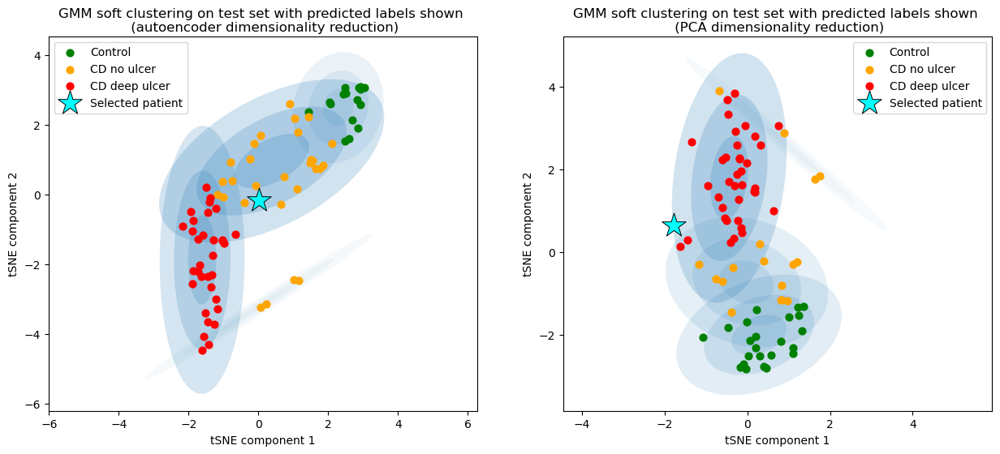

In [115]:
ret = plot_final_gmm_models(gmm_models_list, train_set_list, test_set_list, num_c, selected_patient_idx=selected_patient_idx)

Patient moves from "CD deep ulcer" cluster to "CD no ulcer" cluster - genes may contribute to development of deep ulcer symptoms

### Modify gene expressions for the selected patient - 180/221 genes

In [116]:
test_set = x_test_scaled.copy()
full_ds = full_ds.copy()

In [117]:
with open("../data/deep_117_63.txt", "r") as f:
    genes = f.read().splitlines()
all_sig_set = np.array(genes)
all_sig_set

array(['IRGM', 'MIF', 'TIMM50', 'WNT8A', 'GCM2', 'LOC283299', 'C7orf57',
       'CEACAM7', 'LOC339166', 'REG1P', 'LOC286114', 'LOC100505851',
       'PPP1R17', 'NCRUPAR', 'PGC', 'SELE', 'CRP', 'PROK2', 'FPR1',
       'LOC147646', 'HCAR3', 'NAT8', 'FPR2', 'CXCL9', 'TREM1', 'CLEC5A',
       'BPIFB1', 'FRMD1', 'OTOP2', 'SUSD2', 'OSM', 'IL10RA', 'LCT',
       'FOLH1B', 'NOD2', 'FCGR1A', 'FCRL3', 'EFNB1', 'HSD11B1', 'APOC3',
       'CSF3', 'XPNPEP2', 'CHI3L1', 'CXCR2', 'REG1A', 'IL1RN',
       'LOC392364', 'IL10', 'CXCL6', 'FCN1', 'LYPD1', 'SLC6A4',
       'C16orf78', 'RGS13', 'C19orf59', 'LEPREL1', 'PCDHB3', 'CPO',
       'TCF4', 'PUM2', 'SLC28A2', 'SLC22A4', 'FDCSP', 'CHST4', 'LATS2',
       'DUOXA2', 'HSPA7', 'LOC100506115', 'FHIT', 'CYP3A7', 'EGFL6',
       'MGAM', 'SLC22A5', 'CLVS1', 'OR2M3', 'LYPLAL1', 'IL1B', 'CRIP1',
       'IL12B', 'MUC2', 'TTTY5', 'CLDN8', 'SLC6A14', 'AADAC', 'STAT1',
       'SLC5A4', 'C5orf17', 'MUC1', 'TM4SF19', 'SAA1', 'GUCA2B',
       'LOC100132831', 'SRSF4', 

In [118]:
test_set = modify_expression(pid, all_sig_set, test_set)
test_set.loc[test_set.index.str.startswith(pid)]

,AADAC,APOA1,APOA4,APOB,APOC3,AQP9,C6,CEACAM7,CHI3L1,ABCC2,...,PPP1R17,WNT8A,LSM5,PCDHB3,GUSBP11,C16orf78,C5orf17,LOC100132831,LOC100288778,LOC100505851
Patient_ID,,,,,,,,,,,,,,,,,,,,,
46_CD_deep_ulcer,0.837271,0.482152,0.410237,0.378247,0.740914,0.119375,0.339106,0.173455,0.313654,0.836045,...,0.002552,0.0,0.256714,0.627288,0.525861,0.013901,0.083511,0.13522,0.260092,0.411942


In [119]:
full_ds[-len(test_set):] = test_set

### Re-encode and refit models

In [120]:
gmm_pca, X_train_pca, X_test_pca = re_encode(full_ds, num_c, "PCA")
gmm_ae, X_train_ae, X_test_ae = re_encode(full_ds, num_c, "AE")

gmm_models_list = [gmm_ae, gmm_pca]
train_set_list = [X_train_ae, X_train_pca]
test_set_list = [X_test_ae, X_test_pca]

C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.add_patch(Ellipse(position, nsig * width, nsig * height,
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: Matplotl

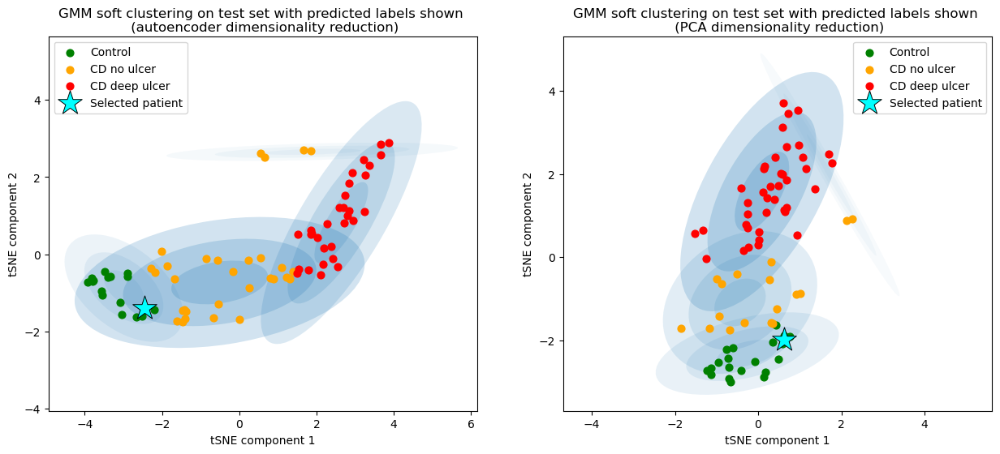

In [121]:
ret = plot_final_gmm_models(gmm_models_list, train_set_list, test_set_list, num_c, selected_patient_idx=selected_patient_idx)

Patient moves from "CD deep ulcer" cluster to "control" cluster - genes may contribute to development of Crohn's disease

## GMM Explainability - CD No Ulcer patient

In [122]:
test_set = x_test_scaled.copy()
full_ds = full_ds.copy()

In [123]:


selected_patient, pid = get_patient(test_set, 'CD_plain', frac=6)
selected_patient

,AADAC,APOA1,APOA4,APOB,APOC3,AQP9,C6,CEACAM7,CHI3L1,ABCC2,...,PPP1R17,WNT8A,LSM5,PCDHB3,GUSBP11,C16orf78,C5orf17,LOC100132831,LOC100288778,LOC100505851
Patient_ID,,,,,,,,,,,,,,,,,,,,,
58_CD_plain,0.712765,0.67885,0.86582,0.855696,0.828452,0.498697,0.567772,0.352862,0.317254,0.76505,...,0.0,0.0,0.20313,0.538437,0.718794,0.0,0.0,0.143114,0.526186,0.189998


In [124]:
pid

'58_CD_plain'

In [125]:
ind = test_set.index
selected_patient_idx = ind.get_loc(pid)
selected_patient_idx

11

C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.add_patch(Ellipse(position, nsig * width, nsig * height,
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: Matplotl

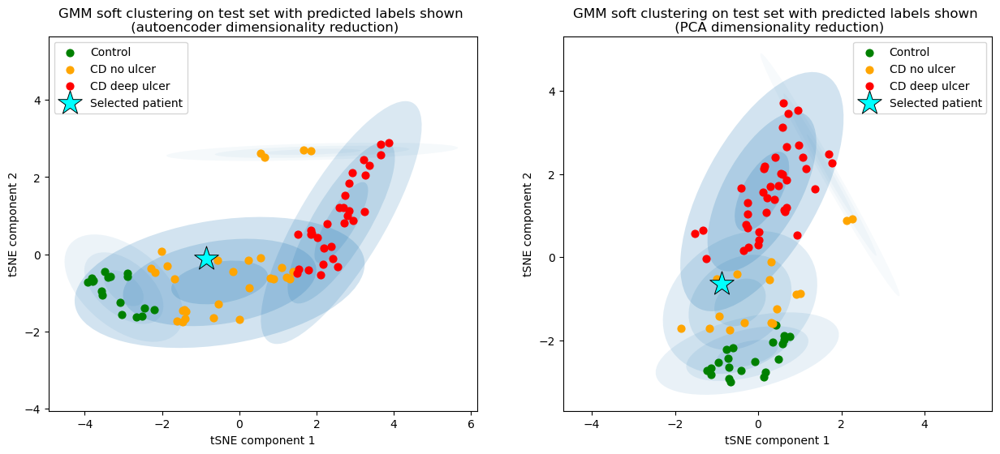

In [126]:
ret = plot_final_gmm_models(gmm_models_list, train_set_list, test_set_list, num_c, selected_patient_idx=selected_patient_idx)

Initial position of patient in clustering model

### Modify gene expressions for the selected patient - 91/221 genes

In [127]:
test_set = x_test_scaled.copy()
full_ds = full_ds.copy()

In [128]:
with open("../data/plain_91.txt", "r") as f:
    genes = f.read().splitlines()
smallest_set = np.array(genes)
smallest_set

array(['LOC286114', 'C7orf57', 'WNT8A', 'LSM5', 'BPIFB1', 'LOC147646',
       'IL10', 'TM4SF19', 'IRGM', 'C16orf78', 'NCRUPAR', 'CLEC5A',
       'C5orf17', 'LOC100505851', 'OR2M3', 'SLC11A1', 'LEPREL1', 'CRP',
       'LAMC3', 'CHI3L1', 'LOC339166', 'PTPN2', 'DUOX2', 'HSPA7', 'CXCR2',
       'PPP1R17', 'REG1P', 'MMP1', 'PUM2', 'FCRL3', 'CLDN8', 'HCAR3',
       'CYP3A7', 'MUC2', 'AADAC', 'FHIT', 'SHISA2', 'SELE', 'EFNB1',
       'RNF24', 'PCDHB3', 'FAM92A3', 'CXCR1', 'FCN1', 'CLVS1', 'TIMM50',
       'G6PC', 'FXYD5', 'DHDH', 'FCGR1C', 'STAT3', 'SLC34A3', 'APOB',
       'TNFAIP3', 'TPMT', 'LOC100288778', 'CYP3A4', 'TTTY5', 'SLC5A4',
       'FDCSP', 'GSTA5', 'S100A12', 'LOC392364', 'SRRD', 'KCNJ15',
       'DUOXA2', 'TNFAIP6', 'LYPD1', 'TNF', 'PTPN22', 'TLR2', 'SLC28A2',
       'TM4SF4', 'OTOP2', 'SUSD2', 'GLT1D1', 'IL12B', 'CDHR1', 'MIF',
       'MUC1', 'GCM2', 'SLC5A11', 'IL1B', 'FOXD1', 'FOLH1', 'HSD11B1',
       'XPNPEP2', 'CPO', 'PNLIPRP2', 'SAA1', 'GPR89B'], dtype='<U12')

In [129]:
test_set = modify_expression(pid, smallest_set, test_set)
test_set.loc[test_set.index.str.startswith(pid)]

,AADAC,APOA1,APOA4,APOB,APOC3,AQP9,C6,CEACAM7,CHI3L1,ABCC2,...,PPP1R17,WNT8A,LSM5,PCDHB3,GUSBP11,C16orf78,C5orf17,LOC100132831,LOC100288778,LOC100505851
Patient_ID,,,,,,,,,,,,,,,,,,,,,
58_CD_plain,0.837271,0.67885,0.86582,0.834515,0.828452,0.498697,0.567772,0.352862,0.313654,0.76505,...,0.002552,0.0,0.256714,0.627288,0.718794,0.013901,0.083511,0.143114,0.619499,0.411942


In [130]:
full_ds[-len(test_set):] = test_set

### Re-encode and refit models

In [131]:
gmm_pca, X_train_pca, X_test_pca = re_encode(full_ds, num_c, "PCA")
gmm_ae, X_train_ae, X_test_ae = re_encode(full_ds, num_c, "AE")

gmm_models_list = [gmm_ae, gmm_pca]
train_set_list = [X_train_ae, X_train_pca]
test_set_list = [X_test_ae, X_test_pca]

C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.add_patch(Ellipse(position, nsig * width, nsig * height,
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: Matplotl

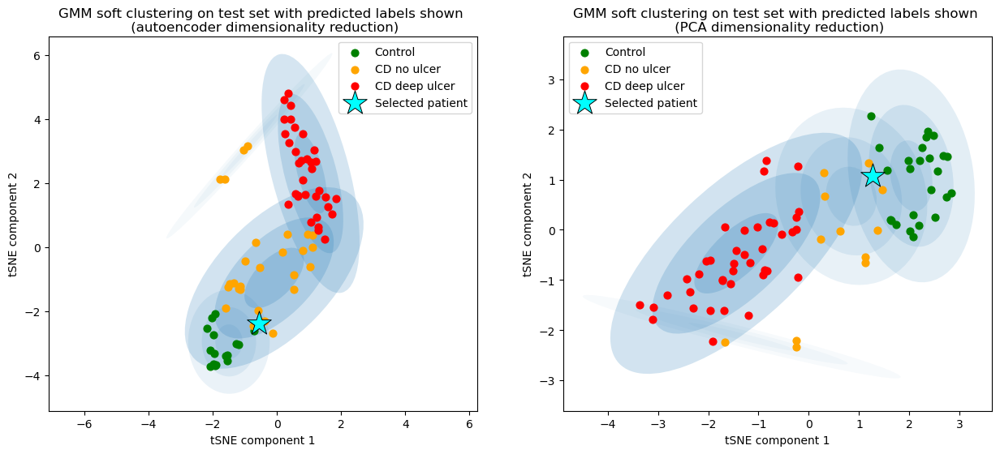

In [132]:
ret = plot_final_gmm_models(gmm_models_list, train_set_list, test_set_list, num_c, selected_patient_idx=selected_patient_idx)

### Modify gene expressions for the selected patient - 155/221 genes

In [133]:
test_set = x_test_scaled.copy()
full_ds = full_ds.copy()

In [134]:
with open("../data/plain_91_19_45.txt", "r") as f:
    genes = f.read().splitlines()
all_sig_set = np.array(genes)
all_sig_set

array(['LOC286114', 'C7orf57', 'WNT8A', 'LSM5', 'BPIFB1', 'LOC147646',
       'IL10', 'TM4SF19', 'IRGM', 'C16orf78', 'NCRUPAR', 'CLEC5A',
       'C5orf17', 'LOC100505851', 'OR2M3', 'SLC11A1', 'LEPREL1', 'CRP',
       'LAMC3', 'CHI3L1', 'LOC339166', 'PTPN2', 'DUOX2', 'HSPA7', 'CXCR2',
       'PPP1R17', 'REG1P', 'MMP1', 'PUM2', 'FCRL3', 'CLDN8', 'HCAR3',
       'CYP3A7', 'MUC2', 'AADAC', 'FHIT', 'SHISA2', 'SELE', 'EFNB1',
       'RNF24', 'PCDHB3', 'FAM92A3', 'CXCR1', 'FCN1', 'CLVS1', 'TIMM50',
       'G6PC', 'FXYD5', 'DHDH', 'FCGR1C', 'STAT3', 'SLC34A3', 'APOB',
       'TNFAIP3', 'TPMT', 'LOC100288778', 'CYP3A4', 'TTTY5', 'SLC5A4',
       'FDCSP', 'GSTA5', 'S100A12', 'LOC392364', 'SRRD', 'KCNJ15',
       'DUOXA2', 'TNFAIP6', 'LYPD1', 'TNF', 'PTPN22', 'TLR2', 'SLC28A2',
       'TM4SF4', 'OTOP2', 'SUSD2', 'GLT1D1', 'IL12B', 'CDHR1', 'MIF',
       'MUC1', 'GCM2', 'SLC5A11', 'IL1B', 'FOXD1', 'FOLH1', 'HSD11B1',
       'XPNPEP2', 'CPO', 'PNLIPRP2', 'SAA1', 'GPR89B', 'TNNT2', 'CHST4',
       '

In [135]:
test_set = modify_expression(pid, all_sig_set, test_set)
test_set.loc[test_set.index.str.startswith(pid)]

,AADAC,APOA1,APOA4,APOB,APOC3,AQP9,C6,CEACAM7,CHI3L1,ABCC2,...,PPP1R17,WNT8A,LSM5,PCDHB3,GUSBP11,C16orf78,C5orf17,LOC100132831,LOC100288778,LOC100505851
Patient_ID,,,,,,,,,,,,,,,,,,,,,
58_CD_plain,0.837271,0.67885,0.86582,0.834515,0.740914,0.119375,0.567772,0.173455,0.313654,0.836045,...,0.002552,0.0,0.256714,0.627288,0.718794,0.013901,0.083511,0.143114,0.619499,0.411942


In [136]:
full_ds[-len(test_set):] = test_set

### Re-encode and refit models

In [137]:
gmm_pca, X_train_pca, X_test_pca = re_encode(full_ds, num_c, "PCA")
gmm_ae, X_train_ae, X_test_ae = re_encode(full_ds, num_c, "AE")

gmm_models_list = [gmm_ae, gmm_pca]
train_set_list = [X_train_ae, X_train_pca]
test_set_list = [X_test_ae, X_test_pca]

C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.add_patch(Ellipse(position, nsig * width, nsig * height,
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\3049541760.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_test[test_set_clusters==i, 0], X_test[test_set_clusters==i, 1], c=colours[i], label=cluster_names[i], s=40, cmap='viridis', zorder=2)
C:\Users\shard\AppData\Local\Temp\ipykernel_44724\7955962.py:19: Matplotl

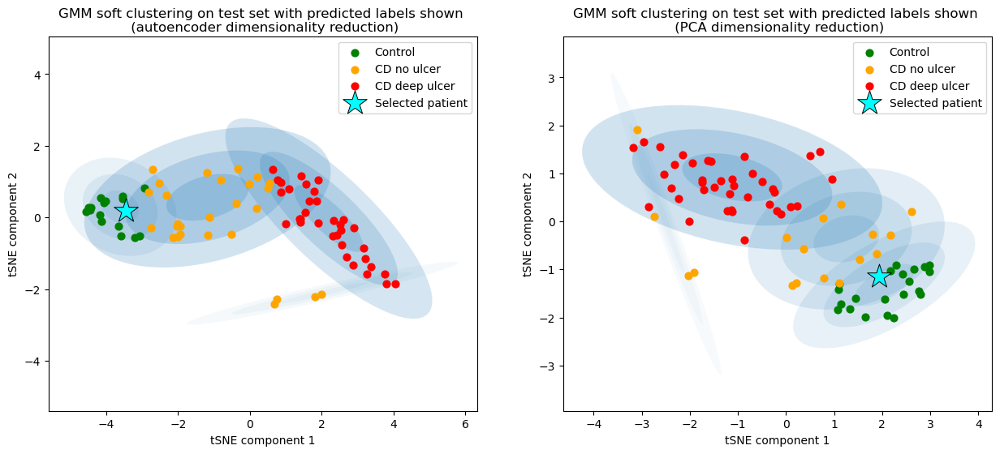

In [138]:
ret = plot_final_gmm_models(gmm_models_list, train_set_list, test_set_list, num_c, selected_patient_idx=selected_patient_idx)

Patient moves from "CD deep ulcer" cluster to "control" cluster - genes may contribute to the development of Crohn's disease